# Clustering set up

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.io as sio
import os
import subprocess
import bisect
import errno
import time
import pandas
# import cPickle as pickle
import pickle
import math
from sklearn.decomposition import PCA
from sklearn.svm import SVC, SVR, LinearSVC
from sklearn.metrics import accuracy_score, silhouette_score, adjusted_rand_score
from sklearn.metrics.cluster import contingency_matrix
from sklearn.cluster import AgglomerativeClustering, SpectralClustering, KMeans
from sklearn.neighbors import kneighbors_graph
from sklearn.manifold import spectral_embedding
from sklearn.cluster._spectral import discretize
from sklearn.model_selection import KFold, LeaveOneOut, train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.kernel_ridge import KernelRidge
from sklearn import linear_model
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE
import scipy.optimize as optimize
import scipy.stats as stats
from sklearn.metrics import roc_auc_score as auROC
import statsmodels.api as sm
import statsmodels.formula.api as smf
from patsy import (ModelDesc, EvalEnvironment, Term, EvalFactor, LookupFactor, dmatrices, INTERCEPT)
from statsmodels.distributions.empirical_distribution import ECDF
import PIL
from itertools import product
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.colorbar as colorbar
import sys
import re
import glob
from pathlib import Path
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.filters.filtertools import recursive_filter, convolution_filter
from statsmodels.stats.multitest import multipletests
import plotly.graph_objects as go

In [2]:
sys.path.append("/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/SpectralClustering")
from cluster_funcs import *

In [3]:
sns.set_style('ticks')
import matplotlib as mpl
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8
mpl.rcParams['legend.fontsize'] = 8
mpl.rcParams['legend.labelspacing'] = 0.2
mpl.rcParams['axes.labelpad'] = 2
mpl.rcParams['xtick.major.size'] = 2
mpl.rcParams['xtick.major.width'] = 0.5
mpl.rcParams['xtick.major.pad'] = 1
mpl.rcParams['ytick.major.size'] = 2
mpl.rcParams['ytick.major.width'] = 0.5
mpl.rcParams['ytick.major.pad'] = 1
mpl.rcParams['lines.scale_dashes'] = False
mpl.rcParams['lines.dashed_pattern'] = (2, 1)
mpl.rcParams['font.sans-serif'] = ['Arial']
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['text.color'] = 'k'

In [4]:
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

In [5]:
# important vars
basepath = "/Volumes/Vijay4_backup/"

## Function defs

In [6]:
def build_knn(X, k):
    """Return sparse k-NN connectivity graph (CSR)."""
    return kneighbors_graph(
        X, k,
        mode="connectivity",
        include_self=True,    # matches SpectralClustering default
        n_jobs=-1
    )

In [7]:
def load_in_data(animals, keyword_session,
                 variable_within_session,
                 load_data=False,
                 signal_type='_medianscaling'):
    if variable_within_session:
        pre_window_size = 10
        pre_label=variable_within_session[1:]
    elif 'sucrose' in keyword_session:
        pre_window_size = 10
        pre_label = 'First lick after delivery '
    elif 'reward_rewardinh' in keyword_session:
        pre_window_size = int(2*framerate) # 1 s before "cue" (not delivered) and 1 s until reward
        pre_label = 'Reward delivery'
    elif 'spontaneousinhibition' in keyword_session:
        pre_window_size = int(2*framerate) # 1 s before "cue" (not delivered) and 1 s until reward (not delivered)
        pre_label = 'Spontaneous inhibition'
    elif keyword_session == 'reward':
        pre_window_size = 10
        pre_label = 'First lick after delivery '        
    else:
        pre_window_size = 15
        pre_label = 'CS'

    
    temp = None
    cuedur = None
    for animal in animals:
        base = Path(basepath + '2p data/' + animal + '/')
        # print("base is ", base)
        try:
            indir = next(p for p in base.iterdir() if p.is_dir() and p.name.endswith(keyword_session))
            with open(indir / f"Alignedtotrial{signal_type}{variable_within_session}.pickle", "rb") as f:
                temp = pickle.load(f, encoding="latin1", fix_imports=True)
            
            if keyword_session == 'reward':
                matfile = next(p for p in indir.glob("*.mat") if "results" not in p.name)
                behaviordata = sio.loadmat(matfile)
            else:
                matfile = next(p for p in indir.glob("*.mat") if "results" in p.name)
                behaviordata = sio.loadmat(matfile)
                cuedur = float(np.squeeze(behaviordata['cuedur']))
            break
        except (StopIteration, FileNotFoundError):
            print(f"Session not found for {animal}")

    if temp is None:
        raise RuntimeError("No sessions located for: %s" % animals)
    
    align_temp = {}
    keys_withtrials = [key for key in temp.keys() if temp[key].shape[0]>0]

    if variable_within_session:
        pass
    elif 'sucrose' in keys_withtrials:    
        keys_withtrials = ['sucrose', 'quinine']
    elif 'reward' in keys_withtrials:
        keys_withtrials = ['reward']
    elif cuedur==0:
        if 'spontaneousinhibition' in keyword_session:
            keys_withtrials = ['laser']
        else:
            keys_withtrials = ['nolaser', 'laser']
    else:
        if 'laser' not in keys_withtrials:
            keys_withtrials = [key for key in keys_withtrials if 'nolaser' not in key]

            temp1 = [s for s in keys_withtrials if 'plus_' in s]
            if len(temp1)<2:
                keys_withtrials.remove(temp1[0])
            else:
                keys_withtrials.remove('plus')

            temp1 = [s for s in keys_withtrials if 'minus_' in s]
            if len(temp1)<2:
                keys_withtrials.remove(temp1[0])
            else:
                keys_withtrials.remove('minus')
        else:
            keys_withtrials = ['plus_rewarded_nolaser', 'plus_rewarded_laser',
                               'plus_unrewarded_nolaser', 'plus_unrewarded_laser',
                               'minus_nolaser', 'minus_laser']
    print("keys_withtrials: ", keys_withtrials)
    for tempkey in keys_withtrials:
        align_temp[tempkey] = {}

    window_size = temp[tempkey].shape[1]
    if load_data:
        for animal_id in animals:
            basedir = basepath + '2p data/' + animal_id + '/'

            sessions = list(Path(basepath + '2p data/' + animal_id + '/').glob(f"*{keyword_session}"))
            print("list of sessions is ", list(sessions))
            
            for session in sessions:
                print(animal_id, ", ", session)

                try:
                    with open(session / ('Alignedtotrial%s%s.pickle'%(signal_type, variable_within_session)), 
                              'rb') as f:
                        temp = pickle.load(f, encoding="latin1", fix_imports=True)
                    # print(animal_id, session, temp[keys_withtrials[0]].shape)
                except:
                    print('%s does not exist. Continuing'%(session / ('Alignedtotrial%s%s.pickle'%(signal_type,
                                                                                                    variable_within_session))))
                    continue
                    
                for tempkey in keys_withtrials:
                    align_temp[tempkey]['/'.join((animal_id,str(session).split('/')[-1]))] = temp[tempkey]
                    
    return align_temp, pre_window_size, pre_label, window_size 

In [8]:
# need to use the cell log from each animal because the cell clusterings are not aligned
def load_logs(basedir,animal_ids,days):
    cell_log = {};
    sessionnames = {};
    
    for ai in animal_ids:
        cell_log[ai] = {};
        
        temp = pandas.read_csv(os.path.join(basedir,ai,'cell_log_%s.csv'%(ai)),delimiter=',');
        temp = temp.drop('Sl. No.',axis=1);
        tempcol = [x.split('_') for x in temp.columns];
        index = [x in days[ai] for x in [x[0] for x in tempcol]];
        index = [i for i, x in enumerate(index) if x];
        cell_log[ai] = temp.iloc[:,index].to_dict('list');
        sessionnames[ai] = temp.columns[index];

    return cell_log, sessionnames

In [9]:
def remove_nan_trials(fmat): # remove trials containing nans in them before fitting GLM to neurons
    assert(fmat.shape[:-1] == (50,100))
    return fmat[~np.isnan(fmat).any(axis=1).max(axis=-1), ...]

## Data acquisition

In [10]:
keyword_session = 'first day of learning' # 'trained'
variable_within_session = ''
animals = ['VJ_OFC_2', 'VJ_OFC_6', 'VJ_OFC_7', 'VJ_OFC_8', 'VJ_OFC_9']
# animals = ['VJ_OFCVTA_1', 'VJ_OFCVTA_2','VJ_OFCVTA_4', 'VJ_OFCVTA_5', 'VJ_OFCVTA_6', 'VJ_OFCVTA_7', 'VJ_OFCVTA_8']
# animals = ['VJ_OFC_mThalaxons_01', 'VJ_OFC_mThalaxons_02',
           # 'VJ_OFC_mThalaxons_04', 'VJ_OFC_mThalaxons_05', 'VJ_OFC_mThalaxons_06']

if 'VTA' in ''.join(animals):
    celltype = 'OFCVTA'
elif 'NAc' in ''.join(animals):
    celltype = 'OFCNAc'
elif 'OFC_mThalinh_02' in ''.join(animals): # 2 is an experimental
    celltype = 'OFC mThal inhibition'
elif 'OFC_mThalinh_07' in ''.join(animals): # 2 is an experimental
    celltype = 'OFC mThal control'
elif 'mThalaxons' in ''.join(animals):
    celltype = 'mThalaxons'
else:
    celltype = 'CaMKii'
    
    
centraltendency='baseline subtracted mean'

framerate = 5.0

if 'delay5s' in keyword_session:
    frames_to_reward = 5*framerate
else:
    frames_to_reward = 3*framerate

colors_for_key = {}
colors_for_key['plus'] = (0,0.5,1)
colors_for_key['plus_rewarded'] = (0,0,1)
colors_for_key['plus_unrewarded'] = (0.3,0.3,0.3)
colors_for_key['minus'] = (1,0.5,0)
colors_for_key['minus_rewarded'] = (1,0,0)
colors_for_key['minus_unrewarded'] = (0.7,0.5,0.5)
colors_for_key['first lick after unpredicted reward'] = (0, 1, 1)
colors_for_key['sucrose'] = (0, 0, 0.6)
colors_for_key['quinine'] = (0.6, 0, 0)
colors_for_key['sucrose'] = (0, 0, 0.6)

signaltype = '_medianscaling' #Fluorescence median scaling

In [11]:
align_pop_alltrials, pre_window_size, pre_label, window_size = load_in_data(animals,
                                                                            keyword_session,
                                                                            variable_within_session,
                                                                            load_data=True)

keys_withtrials:  ['plus', 'minus']
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_2/D4_first day of learning')]
VJ_OFC_2 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_2/D4_first day of learning
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_6/D4_first day of learning')]
VJ_OFC_6 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_6/D4_first day of learning
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_7/D4_first day of learning')]
VJ_OFC_7 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_7/D4_first day of learning
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_8/D4_first day of learning')]
VJ_OFC_8 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_8/D4_first day of learning
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_9/D4_first day of learning')]
VJ_OFC_9 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_9/D4_first day of learning


In [12]:
num_nns = sum([align_pop_alltrials['plus'][aid].shape[-1] for aid in align_pop_alltrials['plus'].keys()])
populationdata = np.nan*np.ones((num_nns, len(align_pop_alltrials.keys())*window_size))    
for k, tempkey in enumerate(list(align_pop_alltrials.keys())):
    print(k, tempkey)
    populationdata[:,k*window_size:(k+1)*window_size] = np.concatenate([
        remove_nan_trials(align_pop_alltrials[tempkey][a]).mean(axis=0).squeeze()
        for a in sorted(align_pop_alltrials[tempkey])], axis=1).T

0 plus
1 minus


In [13]:
populationdata

array([[ 0.0048346 ,  0.01451291,  0.01260615, ...,  0.06995679,
         0.0728302 ,  0.07870236],
       [-0.0021614 , -0.00023387,  0.00458647, ...,  0.03289348,
         0.0220287 ,  0.01395315],
       [-0.02037768, -0.01883704, -0.00996059, ...,  0.00259109,
         0.00375165,  0.01161531],
       ...,
       [ 0.00281156,  0.03181367, -0.00314108, ..., -0.0057176 ,
        -0.00953785,  0.00494617],
       [-0.00226959,  0.01598496, -0.0058381 , ..., -0.02449916,
         0.00205289, -0.00958498],
       [ 0.00021516,  0.02019476,  0.03335345, ...,  0.01601811,
        -0.00182993, -0.02907072]], shape=(1648, 200))

In [14]:
# np.save('populationdata_GLM_filtered_firstday.npy', populationdata)

## GLM for seeing if there are responsive cells to CS on first day

For Vijay's dataset, I am finding neurons that are highly responsive to CS+ during the cue-reward period. I just create the design matrix to reflect that. The design matrix has just 2 covariates, one for a CS+/- indicator variable, and another for the coefficient. All CS+ trials are 1's, and CS- are 0's. then I filter out cells than don't have a statistically significant coefficient (p < alpha=0.05) as "non responsive cells"

In [15]:
# use with first day data, load above
trialtypes = [t for t in align_pop_alltrials]

In [1]:
# fit each cell sequentially
trialtypes = [t for t in align_pop_alltrials]
iso_frames = slice(0, 101)
glm_info = {}
for animal_day in align_pop_alltrials[trialtypes[0]]:
    print(animal_day)
    # Filter cue-reward period (frames 15-30)
    filtered_csplus = remove_nan_trials(align_pop_alltrials[trialtypes[0]][animal_day])
    filtered_csplus = filtered_csplus[:,iso_frames,:] # isolate frames 15-30
    # print(filtered_csplus.shape)
    filtered_csminus = remove_nan_trials(align_pop_alltrials[trialtypes[1]][animal_day])
    filtered_csminus = filtered_csminus[:,iso_frames,:] # isolate frames 15-30

    csplus = filtered_csplus.reshape(filtered_csplus.shape[0]*filtered_csplus.shape[1], -1)
    csminus = filtered_csminus.reshape(filtered_csminus.shape[0]*filtered_csplus.shape[1], -1)

    # Build design matrix
    csplus_trials_dmat = np.ones((csplus.shape[0],1))
    csminus_trials_dmat = np.zeros((csminus.shape[0],1))
    
    cellstack = np.concatenate((csplus, csminus), axis=0)
    trialstack_dmat = np.concatenate((csplus_trials_dmat, csminus_trials_dmat), axis=0) # the design matrix
    assert(cellstack.shape[0] == trialstack_dmat.shape[0])

    # setup GLM store
    pvals = np.zeros((cellstack.shape[-1],2)) # const, x1 (cs+/- coeff.) in that order
    fit = np.zeros((cellstack.shape[-1],2)) # deviance, aic, bic in that order

    # fit glm per cell
    for neuronidx in range(cellstack.shape[-1]):
        X = sm.add_constant(trialstack_dmat.astype(int)) # add extra coefficient
        gauss_id = sm.GLM(cellstack[:, neuronidx].flatten(), X, family=sm.families.Gaussian()).fit()
        pvals[neuronidx, :] = gauss_id.pvalues
        fit[neuronidx, :] = gauss_id.deviance, gauss_id.aic

    glm_info[animal_day] = {}
    glm_info[animal_day]['pvals'] = pvals
    glm_info[animal_day]['fit'] = fit

NameError: name 'align_pop_alltrials' is not defined

In [17]:
glm_info['data_specs'] = 'pvals: const, x1, (cs+/- coeff.) in that order, fit: deviance, aic, bic in that order'
glm_info['note'] = 'GLM was fit using statsmodels in python using gaussian family with identity link function'

# cluster_dir = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
# with open(os.path.join(cluster_dir,'OFCCaMKII_GLM_results_firstday.pickle'), 'wb') as f:
#     pickle.dump(glm_info, f)

In [18]:
cluster_dir = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
with open(os.path.join(cluster_dir,'OFCCaMKII_GLM_results_firstday.pickle'), 'rb') as f:
    glm_info=pickle.load(f)

In [19]:
alpha = 0.01

In [20]:
animal_days = [x for x in align_pop_alltrials[trialtypes[0]]]
total_filtered_cells = 0
total_cells = 0
for a in animal_days:
    print(a)
    count = np.sum(glm_info[a]['pvals'][:,1] < alpha)
    total_filtered_cells += count
    total_cells += glm_info[a]['pvals'][:,1].size
    print(glm_info[a]['pvals'].shape[0], " total, remaining:", count)

print(total_filtered_cells, " out of ", total_cells)

VJ_OFC_2/D4_first day of learning
172  total, remaining: 103
VJ_OFC_6/D4_first day of learning
297  total, remaining: 227
VJ_OFC_7/D4_first day of learning
410  total, remaining: 233
VJ_OFC_8/D4_first day of learning
386  total, remaining: 173
VJ_OFC_9/D4_first day of learning
383  total, remaining: 195
931  out of  1648


### Reload populationdata and apply filter, plot

In [21]:
keyword_session = 'first day of learning' # 'trained'
variable_within_session = ''
animals = ['VJ_OFC_2', 'VJ_OFC_6', 'VJ_OFC_7', 'VJ_OFC_8', 'VJ_OFC_9']
celltype = 'CaMKii'
centraltendency='baseline subtracted mean'

framerate = 5.0

signaltype = '_medianscaling' #Fluorescence median scaling

print('Loading summary file\n')
_, pre_window_size, pre_label, window_size = load_in_data(animals,
                                                            keyword_session,
                                                            variable_within_session,
                                                            load_data=False)

# sortwindow = [pre_window_size, window_size]

with open((basepath+'2p data/Pooled Results/population_expression'
           '/raw fluorescence/%s/%s/align_pop_%s_%s_animals_%s_measuredas_%s')%(keyword_session,
                                                                                celltype,
                                                                            keyword_session,
                                                                            variable_within_session,
                                                                            animals,
                                                                            centraltendency), 'rb') as f:
    align_pop = pickle.load(f, encoding="latin1", fix_imports=True)
print(align_pop.keys())

Loading summary file

keys_withtrials:  ['plus', 'minus']
dict_keys(['plus', 'minus'])


In [22]:
cluster_dir = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
with open(os.path.join(cluster_dir,'OFCCaMKII_GLM_results_firstday.pickle'), 'rb') as f:
    glm_info = pickle.load(f)

In [23]:
alpha = 0.05
pluskey = list(align_pop.keys())[0]

_, window_size = np.vstack(list(align_pop[pluskey].values())).shape
num_filtered_nns = sum([np.sum(np.sum(glm_info[a]['pvals'][:,1:] < alpha, axis=1) > 0) for a in sorted(align_pop[pluskey])])
num_nomod_nns = sum([np.sum(np.sum(glm_info[a]['pvals'][:,1:] < alpha, axis=1) == 0) for a in sorted(align_pop[pluskey])])
print(num_filtered_nns)
populationdata = np.nan*np.ones((num_filtered_nns, len(align_pop.keys())*window_size))    
nonresponsivedata = np.nan*np.ones((num_nomod_nns, len(align_pop.keys())*window_size)) 
for k, tempkey in enumerate(list(align_pop.keys())):
    print(k, tempkey)
    populationdata[:,k*window_size:(k+1)*window_size] = np.vstack([
        align_pop[tempkey][a][np.sum(glm_info[a]['pvals'][:,1:] < alpha, axis=1) > 0,:] 
                                                                   for a in sorted(align_pop[tempkey])])
    nonresponsivedata[:,k*window_size:(k+1)*window_size] = np.vstack([
        align_pop[tempkey][a][np.sum(glm_info[a]['pvals'][:,1:] < alpha, axis=1) == 0,:] 
                                                                   for a in sorted(align_pop[tempkey])])
    
    
print(populationdata.shape)
print(nonresponsivedata.shape)

1080
0 plus
1 minus
(1080, 200)
(568, 200)


In [4]:
framerate = 5
pre_window_size = 3*framerate # 3 seconds multipled by 5 frames. Corresponds to baseline prior to cues.
window_size = 100 # Total number of frames plotted around a cue
frames_to_reward = 3*framerate # 3 seconds until reward after CS+

sortwindow = [pre_window_size, pre_window_size + frames_to_reward] # Sort responses between CS+ onset and reward.

In [3]:
framerate = 5
pre_window_size = 3*framerate # 3 seconds multipled by 5 frames. Corresponds to baseline prior to cues.
window_size = 100 # Total number of frames plotted around a cue
frames_to_reward = 3*framerate # 3 seconds until reward after CS+

sortwindow = [pre_window_size, pre_window_size + frames_to_reward] # Sort responses between CS+ onset and reward.
sortresponse = np.argsort(np.mean(nonresponsivedata[:,sortwindow[0]:sortwindow[1]], axis=1))[::-1]
# sortresponse corresponds to an ordering of the neurons based on their average response in the sortwindow

cmax = 0.1 # Maximum colormap value. 

trial_types = ['CS+', 'CS-']

cmax         = 0.1
sortwindow   = (15, 100)           # more pythonic tuple
n_trials     = len(trial_types)

NameError: name 'nonresponsivedata' is not defined

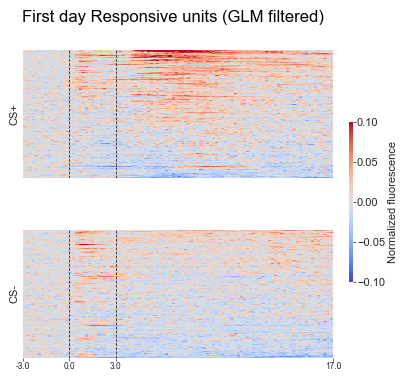

In [25]:
# PSTHs of ' responsive cells '
fig, axs = plt.subplots(
    n_trials, 1,
    figsize=(4, 2*n_trials),
    sharex=False, sharey=False,
    gridspec_kw={'height_ratios': [1, 1], 'hspace': 0.4, 'wspace': 0.3}
)

# Heatmap colorbar
cbar_ax = fig.add_axes([.94, .3, .01, .4])
cbar_ax.tick_params(width=0.5)

fig.suptitle('First day Responsive units (GLM filtered)')
for row, trial_key in enumerate(trial_types):
    ax = axs[row]
    trial_i = slice(row * window_size, (row + 1) * window_size)
    temp = populationdata[:, trial_i]
    sort_idx = np.argsort(np.mean(temp[:, sortwindow[0]:sortwindow[1]], axis=1))[::-1]

    sns.heatmap(
        temp[sort_idx], ax=ax,
        cmap='coolwarm', vmin=-cmax, vmax=cmax,
        cbar_ax=cbar_ax,
        cbar_kws={'label': 'Normalized fluorescence'}
    )
    ax.collections[0].set_rasterized(True)
    ax.grid(False)
    ax.set_yticks([])
    ax.tick_params(width=0.5, length=2)

    if row == n_trials - 1:
        xt = [0, pre_window_size, pre_window_size + frames_to_reward, window_size]
        ax.set_xticks(xt)
        ax.set_xticklabels([(x - pre_window_size) / framerate for x in xt], fontsize=6)
    else:
        ax.set_xticks([])

    ax.axvline(pre_window_size, ls='--', c='k', lw=0.5)
    ax.axvline(pre_window_size + frames_to_reward, ls='--', c='k', lw=0.5)
    ax.set_ylabel(trial_key)

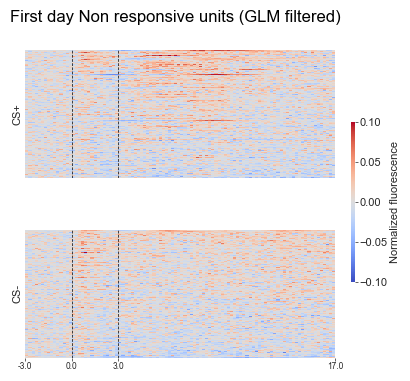

In [26]:
# PSTHs of ' responsive cells '
fig, axs = plt.subplots(
    n_trials, 1,
    figsize=(4, 2*n_trials),
    sharex=False, sharey=False,
    gridspec_kw={'height_ratios': [1, 1], 'hspace': 0.4, 'wspace': 0.3}
)

# Heatmap colorbar
cbar_ax = fig.add_axes([.94, .3, .01, .4])
cbar_ax.tick_params(width=0.5)

fig.suptitle('First day Non responsive units (GLM filtered)')
for row, trial_key in enumerate(trial_types):
    ax = axs[row]
    trial_i = slice(row * window_size, (row + 1) * window_size)
    temp = nonresponsivedata[:, trial_i]
    sort_idx = np.argsort(np.mean(temp[:, sortwindow[0]:sortwindow[1]], axis=1))[::-1]

    sns.heatmap(
        temp[sort_idx], ax=ax,
        cmap='coolwarm', vmin=-cmax, vmax=cmax,
        cbar_ax=cbar_ax,
        cbar_kws={'label': 'Normalized fluorescence'}
    )
    ax.collections[0].set_rasterized(True)
    ax.grid(False)
    ax.set_yticks([])
    ax.tick_params(width=0.5, length=2)

    if row == n_trials - 1:
        xt = [0, pre_window_size, pre_window_size + frames_to_reward, window_size]
        ax.set_xticks(xt)
        ax.set_xticklabels([(x - pre_window_size) / framerate for x in xt], fontsize=6)
    else:
        ax.set_xticks([])

    ax.axvline(pre_window_size, ls='--', c='k', lw=0.5)
    ax.axvline(pre_window_size + frames_to_reward, ls='--', c='k', lw=0.5)
    ax.set_ylabel(trial_key)

### PCA dimensionality reduction of GLM filtered responsive cell data

(1080, 200)
(1080, 200)
Number of PCs = 200
Number of PCs to keep = 9


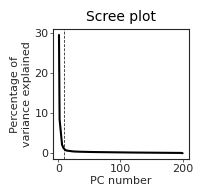

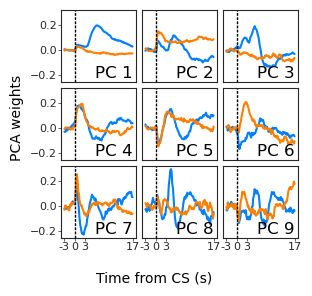

In [110]:
print(populationdata.shape)
pca = PCA(n_components=populationdata.shape[1], whiten=True)
# pca = PCA(n_components='mle', whiten=True)
pca.fit(populationdata) 
    
transformed_data = pca.transform(populationdata)
print(transformed_data.shape)
pca_vectors = pca.components_
print('Number of PCs = %d'%(pca_vectors.shape[0]))

x = 100*pca.explained_variance_ratio_
xprime = x - (x[0] + (x[-1]-x[0])/(x.size-1)*np.arange(x.size))
threshold = np.argmin(xprime)
# Number of PCs to be kept is defined as the number at which the 
# scree plot bends. This is done by simply bending the scree plot
# around the line joining (1, variance explained by first PC) and
# (num of PCs, variance explained by the last PC) and finding the 
# number of components just below the minimum of this rotated plot
print('Number of PCs to keep = %d'%(threshold))
n_pcs = threshold

fig, ax = plt.subplots(figsize=(2,2))
ax.plot(np.arange(pca.explained_variance_ratio_.shape[0]).astype(int)+1, x, 'k')
ax.set_ylabel('Percentage of\nvariance explained')
ax.set_xlabel('PC number')
ax.axvline(threshold, linestyle='--', color='k', linewidth=0.5)
ax.set_title('Scree plot')
# ax.set_xlim([0,50])
# [i.set_linewidth(0.5) for i in ax.spines.itervalues()]
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)

fig.subplots_adjust(left=0.3)
fig.subplots_adjust(right=0.98)
fig.subplots_adjust(bottom=0.25)
fig.subplots_adjust(top=0.9)

numcols = 3.0
fig, axs = plt.subplots(int(np.ceil(threshold/numcols)), int(numcols), sharey='all',
                        figsize=(1*numcols, 1*int(np.ceil(threshold/numcols))),
                        squeeze=False)
for pc in range(threshold):
    ax = axs.flat[pc]
    for k, tempkey in enumerate(align_pop.keys()):
        ax.plot(pca_vectors[pc,k*window_size:(k+1)*window_size], color=colors_for_key[tempkey],
                label='PC %d: %s'%(pc+1, tempkey))
    ax.axvline(pre_window_size, linestyle='--', color='k', linewidth=1)
    ax.annotate(text='PC %d'%(pc+1), xy=(0.45, 0.06), xytext=(0.45, 0.06), xycoords='axes fraction',
                textcoords='axes fraction', multialignment='center', size='large')
    if pc >= threshold-numcols:
        ax.set_xticks([0, pre_window_size,
                       pre_window_size + frames_to_reward, window_size])
        ax.set_xticklabels([str(int((a-pre_window_size+0.0)/framerate))
                             for a in [0, pre_window_size,
                                       pre_window_size + frames_to_reward, window_size]])
    else:
        ax.set_xticks([])
        ax.xaxis.set_ticks_position('none')
    if pc%numcols:
        ax.yaxis.set_ticks_position('none')
    # [i.set_linewidth(0.5) for i in ax.spines.itervalues()]
    # ax.spines['right'].set_visible(False)
    # ax.spines['top'].set_visible(False)


fig.text(0.5, 0.05, 'Time from %s (s)'%(pre_label), horizontalalignment='center', rotation='horizontal')
fig.text(0.02, 0.6, 'PCA weights', verticalalignment='center', rotation='vertical')
fig.tight_layout()
for ax in axs.flat[threshold:]:
    ax.set_visible(False)

fig.subplots_adjust(wspace=0.08, hspace=0.08)
fig.subplots_adjust(left=0.19)
fig.subplots_adjust(right=0.98)
fig.subplots_adjust(bottom=0.2)
fig.subplots_adjust(top=0.96)

## Reclustering

In [18]:
max_n_clusters = 20
# possible_n_pcs = np.arange(threshold, threshold+1)
possible_n_clusters = np.arange(2, max_n_clusters+1)
if populationdata.shape[0]<400: #mThalaxons clustering
    possible_n_nearest_neighbors = np.array([10, 50, 100, 200])
elif populationdata.shape[0]<1000: #OFCVTA clustering
    possible_n_nearest_neighbors = np.array([10, 50, 100, 200, 400])
elif populationdata.shape[0]<2000: # OFC CaMKii first day of learning clustering
    possible_n_nearest_neighbors = np.array([25, 50, 100, 125, 250, 500, 1000])
else: #OFC CaMKii trained clustering
    possible_n_nearest_neighbors = np.array([100, 200, 300, 500, 750, 1000, 1500, 2000, 2500])

iTer = 100
silhouette_scores = np.nan*np.ones((possible_n_nearest_neighbors.size, 
                                    possible_n_clusters.size, 
                                    iTer))
discretize_labels = np.nan*np.ones((possible_n_nearest_neighbors.size, 
                                    possible_n_clusters.size, 
                                    iTer,
                                    transformed_data.shape[0]))

n_pcs = threshold # from scree
print(n_pcs, " PCs retained")
for nnidx, nn in enumerate(possible_n_nearest_neighbors):
    G = build_knn(transformed_data[:,:n_pcs], nn)   
    for n_clustersidx, n_clusters in enumerate(possible_n_clusters):
        embed = spectral_embedding(
                G,
                n_components=n_clusters,
                eigen_solver="arpack",
                drop_first=False)
        
        for i in range(iTer):
            spec_labels = discretize(embed, random_state=None)
            discretize_labels[nnidx,n_clustersidx,i,:] = spec_labels
            silhouette_scores[nnidx,n_clustersidx,i] = silhouette_score(transformed_data[:,:n_pcs], spec_labels, metric='cosine')

        print('Done with numclusters = %d, num nearest neighbors = %d: score = %.3f'%(n_clusters,
                                                                                      nn,
                                                                                      np.mean(silhouette_scores[nnidx, 
                                                                                              n_clustersidx, :])))

print('Done with model fitting')

9  PCs retained


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 2, num nearest neighbors = 25: score = 0.157


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 3, num nearest neighbors = 25: score = 0.139


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 4, num nearest neighbors = 25: score = 0.154


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 5, num nearest neighbors = 25: score = 0.160


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 6, num nearest neighbors = 25: score = 0.168


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 7, num nearest neighbors = 25: score = 0.169


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 8, num nearest neighbors = 25: score = 0.173


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 9, num nearest neighbors = 25: score = 0.182


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 10, num nearest neighbors = 25: score = 0.180


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 11, num nearest neighbors = 25: score = 0.179


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 12, num nearest neighbors = 25: score = 0.175


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 13, num nearest neighbors = 25: score = 0.174


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 14, num nearest neighbors = 25: score = 0.171


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 15, num nearest neighbors = 25: score = 0.169


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 16, num nearest neighbors = 25: score = 0.167


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 17, num nearest neighbors = 25: score = 0.171


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 18, num nearest neighbors = 25: score = 0.168


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 19, num nearest neighbors = 25: score = 0.168


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 20, num nearest neighbors = 25: score = 0.171


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 2, num nearest neighbors = 50: score = 0.162


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 3, num nearest neighbors = 50: score = 0.155


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 4, num nearest neighbors = 50: score = 0.164


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 5, num nearest neighbors = 50: score = 0.170


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 6, num nearest neighbors = 50: score = 0.179


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 7, num nearest neighbors = 50: score = 0.180


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 8, num nearest neighbors = 50: score = 0.181


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 9, num nearest neighbors = 50: score = 0.190


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 10, num nearest neighbors = 50: score = 0.189


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 11, num nearest neighbors = 50: score = 0.188


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 12, num nearest neighbors = 50: score = 0.182


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 13, num nearest neighbors = 50: score = 0.180


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 14, num nearest neighbors = 50: score = 0.182


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 15, num nearest neighbors = 50: score = 0.173


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 16, num nearest neighbors = 50: score = 0.174


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 17, num nearest neighbors = 50: score = 0.175


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 18, num nearest neighbors = 50: score = 0.176


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 19, num nearest neighbors = 50: score = 0.177


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 20, num nearest neighbors = 50: score = 0.179


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 2, num nearest neighbors = 100: score = 0.167


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 3, num nearest neighbors = 100: score = 0.161


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 4, num nearest neighbors = 100: score = 0.159


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 5, num nearest neighbors = 100: score = 0.174


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 6, num nearest neighbors = 100: score = 0.181


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 7, num nearest neighbors = 100: score = 0.185


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 8, num nearest neighbors = 100: score = 0.185


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 9, num nearest neighbors = 100: score = 0.193


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 10, num nearest neighbors = 100: score = 0.191


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 11, num nearest neighbors = 100: score = 0.190


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 12, num nearest neighbors = 100: score = 0.182


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 13, num nearest neighbors = 100: score = 0.180


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 14, num nearest neighbors = 100: score = 0.181


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 15, num nearest neighbors = 100: score = 0.179


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 16, num nearest neighbors = 100: score = 0.176


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 17, num nearest neighbors = 100: score = 0.176


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 18, num nearest neighbors = 100: score = 0.176


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 19, num nearest neighbors = 100: score = 0.177


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 20, num nearest neighbors = 100: score = 0.178


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 2, num nearest neighbors = 125: score = 0.169


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 3, num nearest neighbors = 125: score = 0.160


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 4, num nearest neighbors = 125: score = 0.159


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 5, num nearest neighbors = 125: score = 0.173


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 6, num nearest neighbors = 125: score = 0.179


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 7, num nearest neighbors = 125: score = 0.186


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 8, num nearest neighbors = 125: score = 0.187


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 9, num nearest neighbors = 125: score = 0.193


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 10, num nearest neighbors = 125: score = 0.191


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 11, num nearest neighbors = 125: score = 0.190


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 12, num nearest neighbors = 125: score = 0.179


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 13, num nearest neighbors = 125: score = 0.179


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 14, num nearest neighbors = 125: score = 0.180


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 15, num nearest neighbors = 125: score = 0.177


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 16, num nearest neighbors = 125: score = 0.176


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 17, num nearest neighbors = 125: score = 0.175


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 18, num nearest neighbors = 125: score = 0.175


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 19, num nearest neighbors = 125: score = 0.177


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 20, num nearest neighbors = 125: score = 0.174


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 2, num nearest neighbors = 250: score = 0.169


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 3, num nearest neighbors = 250: score = 0.162


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 4, num nearest neighbors = 250: score = 0.161


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 5, num nearest neighbors = 250: score = 0.174


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 6, num nearest neighbors = 250: score = 0.176


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 7, num nearest neighbors = 250: score = 0.181


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 8, num nearest neighbors = 250: score = 0.188


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 9, num nearest neighbors = 250: score = 0.190


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 10, num nearest neighbors = 250: score = 0.188


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 11, num nearest neighbors = 250: score = 0.186


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 12, num nearest neighbors = 250: score = 0.173


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 13, num nearest neighbors = 250: score = 0.167


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 14, num nearest neighbors = 250: score = 0.162


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 15, num nearest neighbors = 250: score = 0.155


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 16, num nearest neighbors = 250: score = 0.152


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 17, num nearest neighbors = 250: score = 0.147


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 18, num nearest neighbors = 250: score = 0.142


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 19, num nearest neighbors = 250: score = 0.140


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 20, num nearest neighbors = 250: score = 0.136


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 2, num nearest neighbors = 500: score = 0.169


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 3, num nearest neighbors = 500: score = 0.162


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 4, num nearest neighbors = 500: score = 0.157


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 5, num nearest neighbors = 500: score = 0.167


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 6, num nearest neighbors = 500: score = 0.168


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 7, num nearest neighbors = 500: score = 0.171


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 8, num nearest neighbors = 500: score = 0.179


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 9, num nearest neighbors = 500: score = 0.177


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 10, num nearest neighbors = 500: score = 0.175


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 11, num nearest neighbors = 500: score = 0.150


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 12, num nearest neighbors = 500: score = 0.117


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 13, num nearest neighbors = 500: score = 0.096


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 14, num nearest neighbors = 500: score = 0.078


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 15, num nearest neighbors = 500: score = 0.060


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 16, num nearest neighbors = 500: score = 0.043


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 17, num nearest neighbors = 500: score = 0.034


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 18, num nearest neighbors = 500: score = 0.024


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 19, num nearest neighbors = 500: score = 0.015


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 20, num nearest neighbors = 500: score = 0.005


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 2, num nearest neighbors = 1000: score = 0.055


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 3, num nearest neighbors = 1000: score = -0.018


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 4, num nearest neighbors = 1000: score = -0.048


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 5, num nearest neighbors = 1000: score = -0.052


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 6, num nearest neighbors = 1000: score = -0.035


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 7, num nearest neighbors = 1000: score = -0.025


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 8, num nearest neighbors = 1000: score = 0.019


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 9, num nearest neighbors = 1000: score = 0.023


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 10, num nearest neighbors = 1000: score = 0.018


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 11, num nearest neighbors = 1000: score = 0.029


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 12, num nearest neighbors = 1000: score = 0.028


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 13, num nearest neighbors = 1000: score = 0.012


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 14, num nearest neighbors = 1000: score = 0.004


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 15, num nearest neighbors = 1000: score = -0.005


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 16, num nearest neighbors = 1000: score = -0.011


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 17, num nearest neighbors = 1000: score = -0.023


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 18, num nearest neighbors = 1000: score = -0.032


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 19, num nearest neighbors = 1000: score = -0.032


/Users/lukepemberton/miniforge3/envs/ofc_processing/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


Done with numclusters = 20, num nearest neighbors = 1000: score = -0.036
Done with model fitting


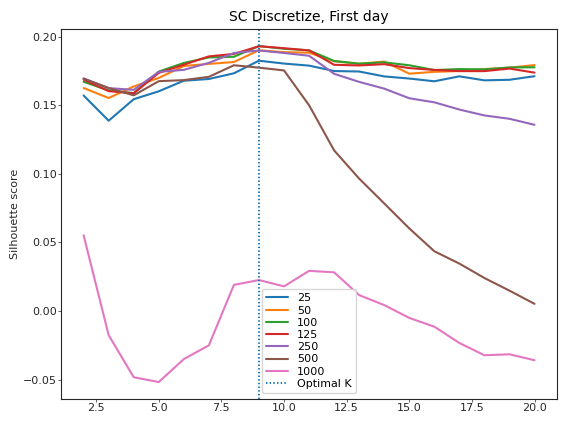

In [19]:
plt.figure()
for nnidx, nn in enumerate(possible_n_nearest_neighbors):
    plt.plot(possible_n_clusters, np.nanmean(silhouette_scores, axis=-1)[nnidx, :], label=str(nn))
plt.title("SC Discretize, First day")
plt.ylabel("Silhouette score")
plt.axvline(np.argmax(np.max(np.nanmean(silhouette_scores,axis=-1),axis=0)) + 2, linestyle=':', label='Optimal K')
plt.legend()
plt.show()

In [20]:
temp = {}
temp['possible_n_clusters'] = possible_n_clusters
temp['possible_n_nearest_neighbors'] = possible_n_nearest_neighbors
temp['silhouette_scores'] = silhouette_scores
temp['shape'] = 'pc_cluster_nn'

In [11]:
cluster_dir = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"

with open(os.path.join(cluster_dir,'OFCCaMKII_GLM_results_firstday.pickle'), 'rb') as f:
    glm_info = pickle.load(f)

populationdata = np.load('populationdata_GLM_filtered_firstday.npy')

savepath = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"

# sessions = sorted(list(align_pop[list(align_pop.keys())[0]].keys()))
ref = list(glm_info.keys())[:-2]
sessions = sorted(ref)
print(sessions)

# numneuronsinsession = [align_pop[list(align_pop.keys())[0]][key].shape[0] for key in sessions]
numneuronsinsession = [np.sum(glm_info[key]['pvals'][:,1] < alpha) for key in sessions]
print(numneuronsinsession, sum(numneuronsinsession))
cumnumneuronsinsession = np.concatenate((np.array([0]), np.cumsum(np.array(numneuronsinsession))))
print(cumnumneuronsinsession, cumnumneuronsinsession[-1])


temp = np.where(silhouette_scores==np.max(silhouette_scores))
opt_nclusters = possible_n_clusters[temp[1][0]] # 9
opt_nearest_neighbors = possible_n_nearest_neighbors[temp[0][0]]
label_set = np.squeeze(discretize_labels[temp[0][0], temp[1][0], ...])

print(opt_nclusters, opt_nearest_neighbors)
print(label_set.shape)

['VJ_OFC_2/D4_first day of learning', 'VJ_OFC_6/D4_first day of learning', 'VJ_OFC_7/D4_first day of learning', 'VJ_OFC_8/D4_first day of learning', 'VJ_OFC_9/D4_first day of learning']


NameError: name 'alpha' is not defined

In [12]:
def reorder_clusters(rawlabels):
    uniquelabels = list(set(rawlabels))
    responses = np.nan*np.ones((len(uniquelabels),))
    for l, label in enumerate(uniquelabels):
        responses[l] = np.mean(populationdata[rawlabels==label, pre_window_size:2*pre_window_size])
    temp = np.argsort(responses).astype(int)[::-1]
    temp = np.array([np.where(temp==a)[0][0] for a in uniquelabels])
    outputlabels = np.array([temp[a] for a in list(np.digitize(rawlabels, uniquelabels)-1)])
    return outputlabels

In [13]:
newlabels_set = np.stack([reorder_clusters(label_set[i,:].squeeze()) 
                                for i in range(label_set.shape[0])],
                                axis = 1)
print(newlabels_set.shape)
print(np.unique(newlabels_set[:,0]))
print(np.unique(newlabels_set[:,1]))
print(np.unique(newlabels_set))

NameError: name 'label_set' is not defined

In [ ]:
# insert co clustering plot

In [28]:
uniquelabels = np.unique(newlabels_set)

clusterlabels = {}

numneuronsperlabel = np.nan*np.ones((len(sessions), len(uniquelabels)))
for s, session in enumerate(sessions):
    # label non responsive neurons as -1 and then keep all other cluster labels
    colfilter_ = (glm_info[session]['pvals'][:,1] < alpha).astype(int) # convert booleans to int
    filter_ = np.tile(colfilter_, (newlabels_set.shape[-1],1))
    print(filter_.shape)
    filter_[:, colfilter_ == 0] = -1
    labels_ref = newlabels_set[cumnumneuronsinsession[s]:cumnumneuronsinsession[s+1],:]
    filter_[:, colfilter_ == 1] = labels_ref.T
    clusterlabels[session] = filter_
    for l, label in enumerate(uniquelabels):
        numneuronsperlabel[s, l] = np.sum(clusterlabels[session]==label)

print("finished distributing cluster labels")

(100, 172)
(100, 297)
(100, 410)
(100, 386)
(100, 383)
finished distributing cluster labels


In [22]:
# savepath = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
# with open((savepath+"/cluster_labels_npcs_%d_discretize_GLM_broadcasted_firstday_100reps.pickle")%(n_pcs), 'wb') as f:
#     pickle.dump(clusterlabels, f)

In [14]:
savepath = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
with open((savepath+"/cluster_labels_npcs_9_discretize_GLM_broadcasted_firstday_100reps.pickle"), 'rb') as f:
    clusterlabels = pickle.load(f)

In [ ]:
# ---------------------------------------------------------------------
#  PREP
# ---------------------------------------------------------------------
clusters        = np.asarray(uniquelabels)              # for brevity
conditions      = list(align_pop.keys())                # preserves order
n_clust, n_cond = len(clusters), len(conditions)
cmax            = 0.10

# colours for PSTHs – as many as conditions
psth_colors = sns.color_palette("Set2", n_colors=n_cond)

# ---------------------------------------------------------------------
#  FIGURE / AXES
# ---------------------------------------------------------------------
base_w, base_h = 2.2, 2.0      # width per column, height per heat-map row  (in inches)
fig_w = base_w * n_clust
fig_h = base_h * n_cond + 0.7   # add ~0.7 in for the PSTH row

fig, axs = plt.subplots(
    n_cond + 1, n_clust,
    figsize=(fig_w, fig_h),      # ⇦ bigger canvas
    squeeze=False,
    gridspec_kw={"height_ratios": [1]*n_cond + [0.75]},
    sharex="col"
)
fig.suptitle("Aligned Cluster First day responses", fontsize=14, weight="bold", y=1.05)

# colour-bar (single instance)
cbar_ax = fig.add_axes([.93, .25, .015, .5])
cbar_ax.tick_params(width=0.5)

# keep cluster sizes for the titles
cluster_sizes = np.empty(n_clust, dtype=int)

# ---------------------------------------------------------------------
#  MAIN LOOP
# ---------------------------------------------------------------------
for ci, cluster in enumerate(clusters):

    # axis that will hold the average traces for this column
    psth_ax = axs[-1, ci]
    psth_ax.grid(False)
    
    for ki, cond in enumerate(conditions):

        # --------------------------------------------------------------
        #  DATA SLICE
        # --------------------------------------------------------------
        rows      = np.where(newlabels == cluster)[0]
        start     = ki * window_size
        stop      = start + window_size
        temp      = populationdata[rows, start:stop]
        cluster_sizes[ci] = temp.shape[0]

        # ordering units for the heat-map
        sorter = np.argsort(np.mean(temp[:, sortwindow[0]:sortwindow[1]], axis=1))[::-1]
        temp   = temp[sorter]

        # --------------------------------------------------------------
        #  HEAT-MAP
        # --------------------------------------------------------------
        hm_ax = axs[ki, ci]

        sns.heatmap(
            temp, ax=hm_ax,
            cmap="coolwarm", vmin=-cmax, vmax=cmax,
            cbar=(ci == 0), cbar_ax=cbar_ax if ci == 0 else None
        )
        hm_ax.grid(False)
        hm_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
        hm_ax.set_yticks([])
        hm_ax.tick_params(width=.5)

        # x-tick labels only on last heat-map row
        if ki == n_cond - 1:
            hm_ax.set_xlabel(f"Time from {pre_label} (s)")
            hm_ax.set_xticks([0,
                              pre_window_size,
                              pre_window_size + frames_to_reward,
                              window_size])
            hm_ax.set_xticklabels([
                f"{(a-pre_window_size)/framerate:.0f}"
                for a in [0,
                          pre_window_size,
                          pre_window_size + frames_to_reward,
                          window_size]
            ])
        else:
            hm_ax.set_xticks([])

        # row labels just for first column
        if ci == 0:
            hm_ax.set_ylabel(f"{cond}\nNeurons")

        # --------------------------------------------------------------
        #  PSTH
        # --------------------------------------------------------------
        psth = np.nanmean(temp, axis=0)
        psth_ax.plot(
            psth,
            color=psth_colors[ki],
            lw=2.2,
            label=cond if ci == 0 else None     # legend only once
        )

    # finish PSTH axis styling (once per column)
    psth_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
    psth_ax.set_xlim(0, window_size)
    psth_ax.set_ylim(-cmax, cmax)
    psth_ax.tick_params(width=.5)
    if ci == 0:
        psth_ax.set_ylabel("ΔF/F")
    else:
        psth_ax.set_yticks([])

    # column title
    axs[0, ci].set_title(f"Cluster {cluster+1}\n(n={cluster_sizes[ci]})")

# single legend under the PSTH row
handles, labels = axs[-1, 0].get_legend_handles_labels()
if handles:
    fig.legend(handles, labels, loc="lower center", ncol=n_cond, frameon=False)

# ---------------------------------------------------------------------
#  FINAL LAYOUT
# ---------------------------------------------------------------------
# fig.tight_layout(rect=[0.03, 0.12, 0.92, 0.9])          # leave room bottom/top/colour-bar
plt.show()

### Reshuffling cluster labels using classification - see trained notebook for specifics

In [15]:
savepath = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
# with open((savepath+"/cluster_labels_npcs_%d_discretize_GLM_broadcasted_trained_100reps.pickle")%(n_pcs), 'wb') as f:
#     pickle.dump(clusterlabels, f)

with open((savepath+"/cluster_labels_npcs_9_discretize_GLM_broadcasted_firstday_100reps.pickle"), 'rb') as f:
    clusterlabels = pickle.load(f)

In [16]:
labels = []

for key in list(clusterlabels.keys()):
    labels.extend(list(clusterlabels[key][1,:].squeeze()))

newlabels = np.asarray(labels)
newlabels = newlabels[newlabels > -1]

Text(0.5, 1.0, 'First day Clustering, SC Discretize')

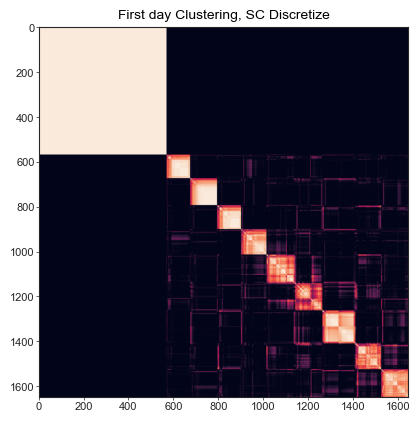

In [17]:
# concatenate labels
labelset = np.concatenate(list(clusterlabels.values()), axis=1)

# insert co clustering plot
plt.figure()
_, perm, probmat = coclustering_pr(labelset.T)
plt.imshow(probmat[perm,:][:,perm])
plt.title("First day Clustering, SC Discretize")

In [74]:
def stacked_percent_heatmap(label_sets, K=None, exclude=None,
                            cmap="viridis", title=None):
    """
    label_sets : list of 1D int arrays (each is a set of labels for one panel)
                 e.g. [np.array([...]), np.array([...]), ...]
    K          : total number of label IDs (0..K-1). If None, inferred from data.
    exclude    : set/list of labels to ignore (e.g., {-1})  [optional]
    """
    # --------- normalize inputs ----------
    cleaned = []
    max_lab = -1
    ex = set(exclude) if exclude is not None else set()
    for arr in label_sets:
        arr = np.asarray(arr)
        if ex:
            arr = arr[~np.isin(arr, list(ex))]
        if arr.size == 0:
            cleaned.append(arr.astype(np.int64))
            continue
        max_lab = max(max_lab, int(arr.max()))
        cleaned.append(arr.astype(np.int64))

    if K is None:
        if max_lab < 0:
            raise ValueError("All label sets empty after exclusion.")
        K = max_lab + 1  # columns 0..K-1

    R = len(cleaned)     # number of panels (e.g., 4813)

    # --------- build (R x K) percentage matrix ----------
    M = np.zeros((R, K), dtype=np.float32)
    for r, arr in enumerate(cleaned):
        if arr.size:
            counts = np.bincount(arr, minlength=K)     # fast histogram per set :contentReference[oaicite:1]{index=1}
            total  = counts.sum()
            if total > 0:
                M[r, :] = counts / total * 100.0

    # --------- plot: one thin row per set ----------
    # keep the figure compact; tweak multipliers to taste
    fig_w = min(16, max(3.0, R * 0.003))   # ~3 px per row at 100 dpi ≈ 0.003 in/row
    fig_h = min(14, max(6.0, K * 0.35))
    fig, ax = plt.subplots(figsize=(fig_w, fig_h))

    im = ax.imshow(M.T, cmap=cmap, vmin=0, vmax=100,  # comparable colors everywhere
                   aspect='auto', interpolation='nearest', rasterized=True)  # thin rows, fast save :contentReference[oaicite:2]{index=2}

    # labels: show only a few x ticks to avoid clutter
    ax.set_xlabel("Label ID")
    ax.set_ylabel("Label set index")
    if K <= 20:
        ax.set_xticks(np.arange(K))
    else:
        step = max(1, K // 10)
        ax.set_xticks(np.arange(0, K, step))
    ax.set_yticks([])  # 4.8k rows are too many to label

    cbar = fig.colorbar(im, ax=ax, shrink=0.8)        # one shared colorbar for all rows :contentReference[oaicite:3]{index=3}
    cbar.set_label("% within set", rotation=90)

    if title:
        ax.set_title(title, pad=10)

    plt.tight_layout()
    plt.show()
    return fig, ax, M

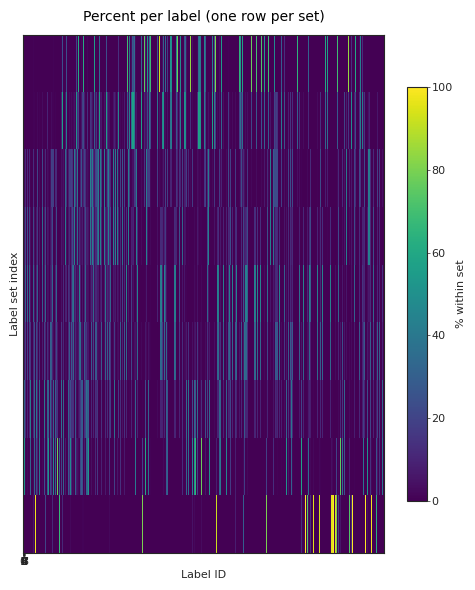

In [75]:
fig, ax, M = stacked_percent_heatmap(
    label_sets=labelset.T, 
    K=None,                  # or None to infer
    exclude={-1},         # if you use -1 as "missing", otherwise drop this
    title="Percent per label (one row per set)"
)

(array([  8.,   4.,   8.,   7.,   6.,  16.,  14.,  17.,   7.,  15.,  20.,
         17.,  11.,  11.,   6.,   8.,   9.,   7.,   2.,   6.,   2.,   5.,
          3.,   7.,   4.,   8.,   6.,   6.,   5.,   6.,   3.,   8.,   5.,
          1.,   7.,   3.,   3.,   2.,   5.,   5.,   0.,   0.,   1.,   0.,
          1.,   1.,   3.,   4.,   3.,   2.,   5.,   3.,  24., 605.]),
 array([ 46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,  56.,
         57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,
         68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,  78.,
         79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,  89.,
         90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99., 100.]),
 <BarContainer object of 54 artists>)

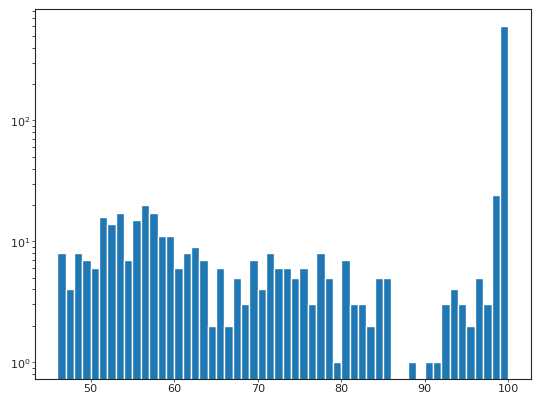

In [76]:
# histogram of the largest percentage label for each cell unit
maxcounts = [np.unique(row,return_counts=True)[1].max() for row in labelset.T]
plt.hist(maxcounts, bins=list(range(46,101)), log=True)

0
[-1  0  1  2  3  4  5  6  7  8]
[0 1 2 3 4 5 6 7 8]
9 2


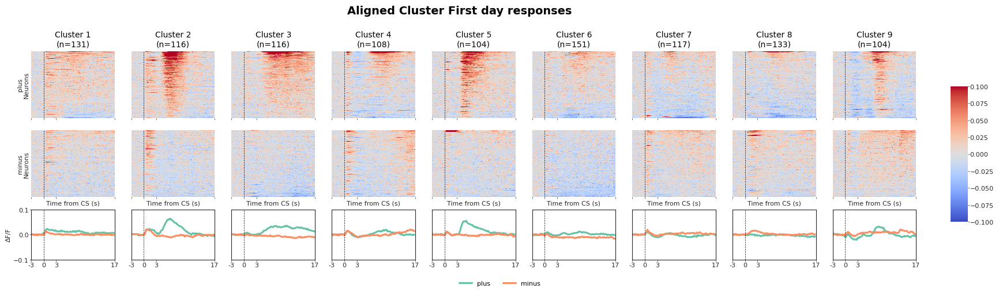

1
[-1  0  1  2  3  4  5  6  7  8]
[0 1 2 3 4 5 6 7 8]
9 2


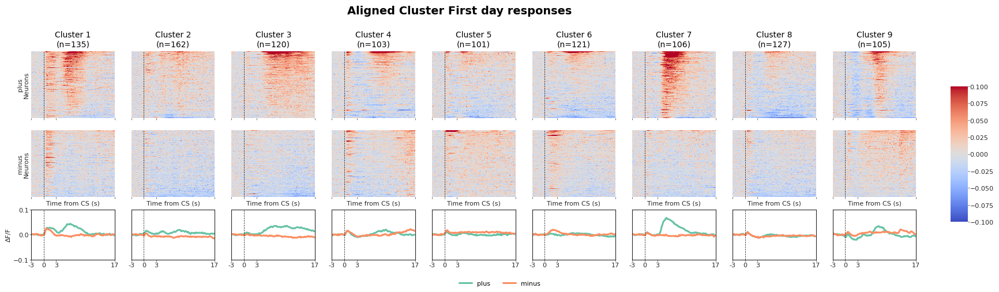

2
[-1  0  1  2  3  4  5  6  7  8]
[0 1 2 3 4 5 6 7 8]
9 2


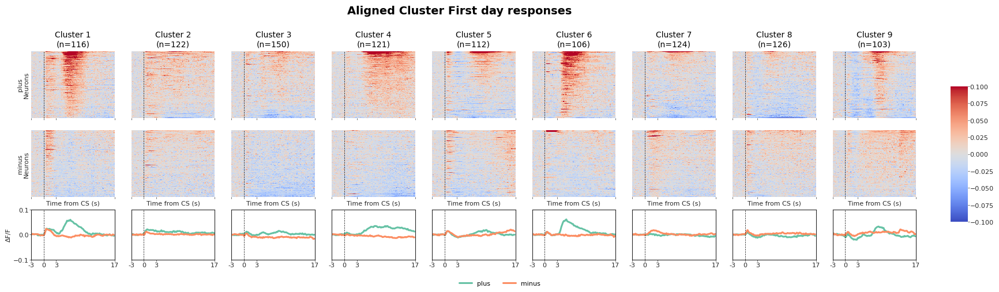

3
[-1  0  1  2  3  4  5  6  7  8]
[0 1 2 3 4 5 6 7 8]
9 2


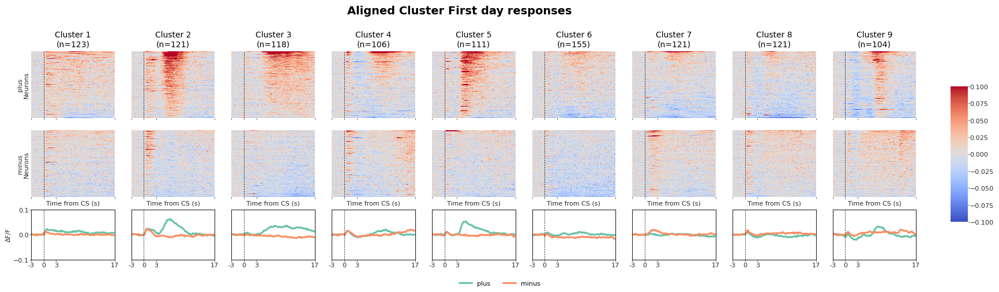

4
[-1  0  1  2  3  4  5  6  7  8]
[0 1 2 3 4 5 6 7 8]
9 2


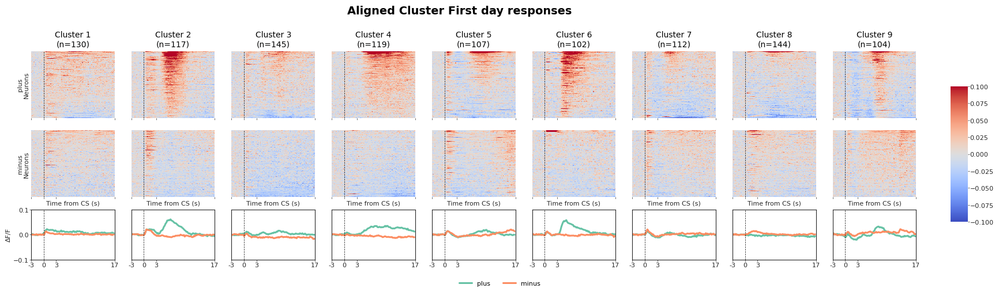

In [97]:
for jdx in range(0,5):
    print(jdx)
    labels = []
    
    for key in list(clusterlabels.keys()):
        labels.extend(list(clusterlabels[key][jdx,:].squeeze()))
    
    newlabels = np.asarray(labels)
    newlabels = newlabels[newlabels > -1]
    
    print(np.unique(labels))
    # this figure is for clustering FILTERED cells 
    # ---------------------------------------------------------------------
    #  PREP
    # ---------------------------------------------------------------------
    clusters        = np.unique(newlabels)             # for brevity
    print(clusters)
    conditions      = list(align_pop.keys())                # preserves order
    n_clust, n_cond = len(clusters), len(conditions)
    print(n_clust, n_cond)
    cmax            = 0.10
    
    # colours for PSTHs – as many as conditions
    psth_colors = sns.color_palette("Set2", n_colors=n_cond)
    
    # ---------------------------------------------------------------------
    #  FIGURE / AXES
    # ---------------------------------------------------------------------
    base_w, base_h = 2.2, 2.0      # width per column, height per heat-map row  (in inches)
    fig_w = base_w * n_clust
    fig_h = base_h * n_cond + 0.7   # add ~0.7 in for the PSTH row
    
    fig, axs = plt.subplots(
        n_cond + 1, n_clust,
        figsize=(fig_w, fig_h),      # ⇦ bigger canvas
        squeeze=False,
        gridspec_kw={"height_ratios": [1]*n_cond + [0.75]},
        sharex="col"
    )
    fig.suptitle("Aligned Cluster First day responses", fontsize=14, weight="bold", y=1.05)
    
    # colour-bar (single instance)
    cbar_ax = fig.add_axes([.93, .25, .015, .5])
    cbar_ax.tick_params(width=0.5)
    
    # keep cluster sizes for the titles
    cluster_sizes = np.empty(n_clust, dtype=int)
    
    # ---------------------------------------------------------------------
    #  MAIN LOOP
    # ---------------------------------------------------------------------
    for ci, cluster in enumerate(clusters):
    
        # axis that will hold the average traces for this column
        psth_ax = axs[-1, ci]
        psth_ax.grid(False)
        
        for ki, cond in enumerate(conditions):
    
            # --------------------------------------------------------------
            #  DATA SLICE
            # --------------------------------------------------------------
            rows      = np.where(newlabels == cluster)[0]
            start     = ki * window_size
            stop      = start + window_size
            temp      = populationdata[rows, start:stop]
            cluster_sizes[ci] = temp.shape[0]
    
            # ordering units for the heat-map
            sorter = np.argsort(np.mean(temp[:, sortwindow[0]:sortwindow[1]], axis=1))[::-1]
            temp   = temp[sorter]
    
            # --------------------------------------------------------------
            #  HEAT-MAP
            # --------------------------------------------------------------
            hm_ax = axs[ki, ci]
    
            sns.heatmap(
                temp, ax=hm_ax,
                cmap="coolwarm", vmin=-cmax, vmax=cmax,
                cbar=(ci == 0), cbar_ax=cbar_ax if ci == 0 else None
            )
            hm_ax.grid(False)
            hm_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
            hm_ax.set_yticks([])
            hm_ax.tick_params(width=.5)
    
            # x-tick labels only on last heat-map row
            if ki == n_cond - 1:
                hm_ax.set_xlabel(f"Time from {pre_label} (s)")
                hm_ax.set_xticks([0,
                                  pre_window_size,
                                  pre_window_size + frames_to_reward,
                                  window_size])
                hm_ax.set_xticklabels([
                    f"{(a-pre_window_size)/framerate:.0f}"
                    for a in [0,
                              pre_window_size,
                              pre_window_size + frames_to_reward,
                              window_size]
                ])
            else:
                hm_ax.set_xticks([])
    
            # row labels just for first column
            if ci == 0:
                hm_ax.set_ylabel(f"{cond}\nNeurons")
    
            # --------------------------------------------------------------
            #  PSTH
            # --------------------------------------------------------------
            psth = np.nanmean(temp, axis=0)
            psth_ax.plot(
                psth,
                color=psth_colors[ki],
                lw=2.2,
                label=cond if ci == 0 else None     # legend only once
            )
    
        # finish PSTH axis styling (once per column)
        psth_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
        psth_ax.set_xlim(0, window_size)
        psth_ax.set_ylim(-cmax, cmax)
        psth_ax.tick_params(width=.5)
        if ci == 0:
            psth_ax.set_ylabel("ΔF/F")
        else:
            psth_ax.set_yticks([])
    
        # column title
        axs[0, ci].set_title(f"Cluster {cluster+1}\n(n={cluster_sizes[ci]})")
    
    # single legend under the PSTH row
    handles, labels = axs[-1, 0].get_legend_handles_labels()
    if handles:
        fig.legend(handles, labels, loc="lower center", ncol=n_cond, frameon=False)
    
    # ---------------------------------------------------------------------
    #  FINAL LAYOUT
    # ---------------------------------------------------------------------
    # fig.tight_layout(rect=[0.03, 0.12, 0.92, 0.9])          # leave room bottom/top/colour-bar
    plt.show()

Well theres definitely evidence of shuffling, so lets classify the labels across iters. We will match labels up across iters by picking one set of labels, and then match every other iteration with that one set of labels so clusters are aligned - do this by taking for one iteration, compute the average waveform for each cluster. Then, for each other iteration, compute the average waveform for each cluster and match them up with iter1 using LinearSVC() classifier.

In [98]:
labels = []
    
for key in list(clusterlabels.keys()):
    labels.append(clusterlabels[key])

newlabels = np.asarray(np.concatenate(labels, axis=1))
print(list(clusterlabels.keys()))
print(newlabels)

['VJ_OFC_2/D4_first day of learning', 'VJ_OFC_6/D4_first day of learning', 'VJ_OFC_7/D4_first day of learning', 'VJ_OFC_8/D4_first day of learning', 'VJ_OFC_9/D4_first day of learning']
[[ 3  0  7 ... -1  0  7]
 [ 3  4  5 ... -1  1  5]
 [ 4  1  6 ... -1  1  6]
 ...
 [ 8  0  5 ... -1  0  5]
 [ 2  0  7 ... -1  0  7]
 [ 2  0  6 ... -1  0  6]]


In [99]:
keyword_session='first day of learning'
variable_within_session = ''
animals = ['VJ_OFC_2', 'VJ_OFC_6', 'VJ_OFC_7', 'VJ_OFC_8', 'VJ_OFC_9']
align_pop_trained_alltrials, pre_window_size, pre_label, window_size = load_in_data(animals,
                                                                            keyword_session,
                                                                            variable_within_session,
                                                                            load_data=True)
align_pop_alltrials = align_pop_trained_alltrials
num_nns = sum([align_pop_alltrials['plus'][aid].shape[-1] for aid in align_pop_alltrials['plus'].keys()])
fullpopulationdata = np.nan*np.ones((num_nns, len(align_pop_alltrials.keys())*window_size))    
for k, tempkey in enumerate(list(align_pop_alltrials.keys())):
    print(k, tempkey)
    fullpopulationdata[:,k*window_size:(k+1)*window_size] = np.concatenate([
        remove_nan_trials(align_pop_alltrials[tempkey][a]).mean(axis=0).squeeze()
        for a in sorted(align_pop_alltrials[tempkey])], axis=1).T
print(fullpopulationdata, fullpopulationdata.shape)

keys_withtrials:  ['plus', 'minus']
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_2/D4_first day of learning')]
VJ_OFC_2 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_2/D4_first day of learning
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_6/D4_first day of learning')]
VJ_OFC_6 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_6/D4_first day of learning
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_7/D4_first day of learning')]
VJ_OFC_7 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_7/D4_first day of learning
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_8/D4_first day of learning')]
VJ_OFC_8 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_8/D4_first day of learning
list of sessions is  [PosixPath('/Volumes/Vijay4_backup/2p data/VJ_OFC_9/D4_first day of learning')]
VJ_OFC_9 ,  /Volumes/Vijay4_backup/2p data/VJ_OFC_9/D4_first day of learning
0 plus
1 minus
[[ 0.0048346   0.01451291  0.01260615 ...  0.06995679  0.07

So using LinearSVC is not working so well. For some reason, it is reshuffling clusters to the wrong labels, and even duplicating clusters (assigning two clusters the same label). Instead, I will compute the cosine similarity of the entire time series for both CS+&- for each cluster on a given repetition, and assign them based on the highest score.

In [100]:
aligned_labelset = np.zeros(newlabels.shape)

aligned_labelset[0,:] = newlabels[0,:].squeeze().copy()
labels_to_pred = np.unique(newlabels)[1:] # exclude non responsive cells (-1 label)
print("labels to pred. ", labels_to_pred)
# use transformed data / filtered labels instead
filteredlabels = newlabels[0,:].copy()
filteredlabels = filteredlabels[filteredlabels > -1]
# reference_data = np.vstack([np.nanmean(transformed_data[np.where(filteredlabels == cluster)[0],:n_pcs],axis=0) for cluster in labels_to_pred])
reference_data = np.vstack([np.nanmean(populationdata[np.where(filteredlabels == cluster)[0],:],axis=0) for cluster in labels_to_pred])
print("reference shape: ", reference_data.shape)
# clf = LinearSVC().fit(reference_data, labels_to_pred)
# clf = LinearSVC().fit(populationdata, newlabels[0,:].squeeze())

labels to pred.  [0 1 2 3 4 5 6 7 8]
reference shape:  (9, 200)


In [104]:
pred_labels = set(labels_to_pred)
for rep in range(1, newlabels.shape[0]):
    print(rep)
    filteredlabels = newlabels[rep,:].copy()
    filteredlabels = filteredlabels[filteredlabels > -1]
    print("filteredlabels shape: ", filteredlabels.shape)
    clustered_data = np.vstack([np.nanmean(populationdata[np.where(filteredlabels == cluster)[0],:],axis=0) for cluster in labels_to_pred])
    # clustered_data = np.vstack([np.nanmean(transformed_data[np.where(filteredlabels == cluster)[0], :n_pcs],axis=0) for cluster in labels_to_pred])

    # the algorithm is basically sorting according to each columns max
    # ___
    # find the column (corresponding to clustered_data) with the largest cosine sim. value
    # if applicable, assign that to a reference label and mark that column as assigned. if that label is taken, don't do anything.
    # repeat ( do NOT assign a column with an already taken label to the next applicable label. that 
    # might fuck up a potentially better matched column. To avoid running in a loop of that column getting matched with a taken label,
    # delete that columns largest cosine sim. value that corresponds to an already taken column.
    # ___
    labelmatch = cosine_similarity(clustered_data, reference_data)
    # each row is [cosim(cdata[0], refdata[0]), cosim(cdata[0], refdata[1]), cosim(cdata[0], refdata[2]), ...]

    used_labels = set()
    mapping = {} # from clustered_data label to reference_data label (rep 0) --- ( cluster label : ref label )
    while used_labels != pred_labels:
        max_values_per = np.max(labelmatch, axis=1) # get the max value per each row (max columnwise)
        indxs_per = np.argmax(labelmatch, axis=1) 
        has_max_value = np.argmax(max_values_per) # which of the rows has the max ( best match )
        
        maxlabel = indxs_per[has_max_value]
        if maxlabel not in used_labels:
            mapping[has_max_value] = maxlabel
            labelmatch[has_max_value, :] = -2
            used_labels.add(maxlabel)
        else:
            labelmatch[has_max_value, maxlabel] = -2

    
    # predicted_labels = np.argmax(labelmatch, axis=0)
    # print(predicted_labels)
    # print(np.max(labelmatch, axis=0))
            
    # try: 
    #     predicted_labels = clf.predict(clustered_data)
    # except:
    #     print(clustered_data)
    #     print(np.unique(filteredlabels, return_counts=True))
    #     assert False
    print("pred. reorganized labels: ", mapping)
    realigned_labels = newlabels[rep,:].squeeze().copy()
    for key, value in mapping.items():
        # non responsive cells stay the same across iters because they are categorized by the GLM filter
        # realigned_labels[np.where(newlabels[rep,:] == cluster)] = predicted_labels[idx]
        realigned_labels[np.where(newlabels[rep,:] == key)] = value
    aligned_labelset[rep, :] = realigned_labels

1
filteredlabels shape:  (1080,)
pred. reorganized labels:  {np.int64(2): np.int64(2), np.int64(8): np.int64(8), np.int64(3): np.int64(3), np.int64(6): np.int64(4), np.int64(0): np.int64(1), np.int64(1): np.int64(5), np.int64(5): np.int64(7), np.int64(4): np.int64(6), np.int64(7): np.int64(0)}
2
filteredlabels shape:  (1080,)
pred. reorganized labels:  {np.int64(8): np.int64(8), np.int64(3): np.int64(2), np.int64(5): np.int64(4), np.int64(0): np.int64(1), np.int64(4): np.int64(3), np.int64(1): np.int64(0), np.int64(2): np.int64(5), np.int64(6): np.int64(7), np.int64(7): np.int64(6)}
3
filteredlabels shape:  (1080,)
pred. reorganized labels:  {np.int64(2): np.int64(2), np.int64(8): np.int64(8), np.int64(4): np.int64(4), np.int64(3): np.int64(3), np.int64(1): np.int64(1), np.int64(0): np.int64(0), np.int64(5): np.int64(5), np.int64(7): np.int64(6), np.int64(6): np.int64(7)}
4
filteredlabels shape:  (1080,)
pred. reorganized labels:  {np.int64(3): np.int64(2), np.int64(1): np.int64(1), np

In [105]:
print(np.unique(aligned_labelset[32,:]))
print(np.unique(newlabels[32,:]))

[-1.  0.  1.  2.  3.  4.  5.  6.  7.  8.]
[-1  0  1  2  3  4  5  6  7  8]


[[ 3.  0.  7. ... -1.  0.  7.]
 [ 3.  6.  7. ... -1.  5.  7.]
 [ 3.  0.  7. ... -1.  0.  7.]
 ...
 [ 8.  0.  7. ... -1.  0.  7.]
 [ 3.  0.  7. ... -1.  0.  7.]
 [ 3.  0.  7. ... -1.  0.  7.]]


Text(0.5, 1.0, 'First day Clustering, SC Discretize')

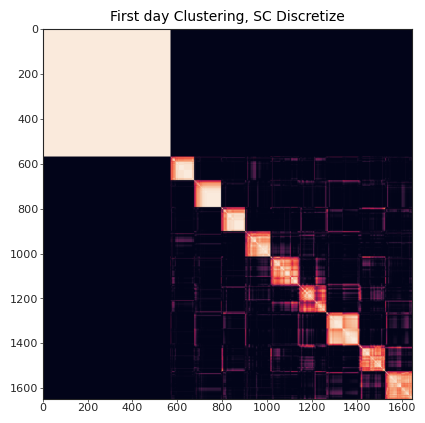

In [107]:
print(aligned_labelset)
# insert co clustering plot
plt.figure()
_, perm, probmat = coclustering_pr(aligned_labelset.T)
plt.imshow(probmat[perm,:][:,perm])
plt.title("First day Clustering, SC Discretize")

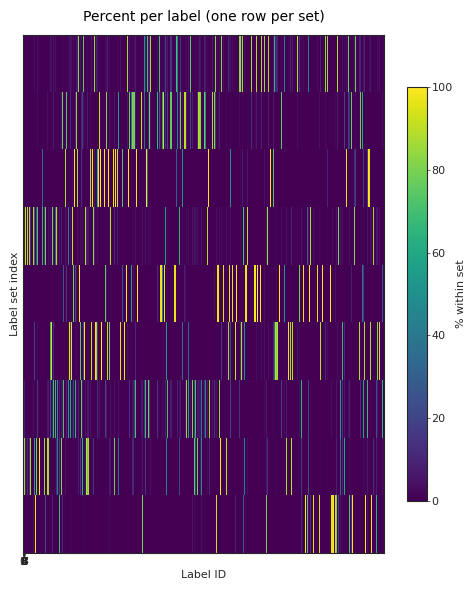

In [112]:
fig, ax, M = stacked_percent_heatmap(
    label_sets=aligned_labelset.T, 
    K=None,                  # or None to infer
    exclude={-1},         # if you use -1 as "missing", otherwise drop this
    title="Percent per label (one row per set)"
)

(array([  5.,   5.,   7.,   5.,   9.,   1.,   5.,   9.,   5.,   7.,   4.,
          3.,   1.,   8.,  15.,   3.,   4.,   5.,  12.,   8.,   3.,  15.,
         15.,   9.,  11.,  15.,  17.,  17.,  20.,  14.,  16.,  25.,  29.,
         23.,  24.,  28.,  27.,  26.,  25.,  30.,  47.,  34.,  61.,  37.,
         21.,  13.,  24.,   9.,  13.,  13.,  33.,  20.,  51., 746.]),
 array([ 46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,  56.,
         57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,
         68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,  78.,
         79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,  89.,
         90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99., 100.]),
 <BarContainer object of 54 artists>)

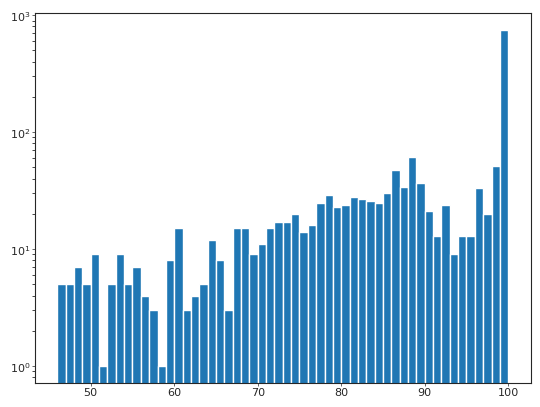

In [113]:
# histogram of the largest percentage label for each cell unit
maxcounts = [np.unique(row,return_counts=True)[1].max() for row in aligned_labelset.T]
plt.hist(maxcounts, bins=list(range(46,101)), log=True)

In [108]:
# save realigned label set
# same order of session keys that you used to set up the complete label set above
numneuronsinsession = [glm_info[key]['pvals'].shape[0] for key in list(clusterlabels.keys())]
print(numneuronsinsession, sum(numneuronsinsession))
cumnumneuronsinsession = np.concatenate((np.array([0]), np.cumsum(np.array(numneuronsinsession))))
print(cumnumneuronsinsession, cumnumneuronsinsession[-1])

alignedclusterlabels = {}
uniquelabels = np.unique(aligned_labelset)

for s, session in enumerate(list(clusterlabels.keys())):
    alignedclusterlabels[session] = aligned_labelset[:,cumnumneuronsinsession[s]:cumnumneuronsinsession[s+1]]


checklabels = []
    
for key in list(alignedclusterlabels.keys()):
    checklabels.append(alignedclusterlabels[key])

checknewlabels = np.asarray(np.concatenate(checklabels, axis=1))

assert(np.all(aligned_labelset == checknewlabels))

print("finished distributing aligned cluster labels")

[172, 297, 410, 386, 383] 1648
[   0  172  469  879 1265 1648] 1648
finished distributing aligned cluster labels


In [111]:
savepath = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
with open((savepath+"/cluster_labels_npcs_%d_discretize_GLM_broadcasted_firstday_100reps_realigned.pickle")%(n_pcs), 'wb') as f:
    pickle.dump(alignedclusterlabels, f)

### Comparing First day / Trained day clustering labels

In [15]:
# plot similarity of day 1 and trained day clustering:
cluster_dir = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
# with open(os.path.join(cluster_dir,'cluster_labels_npcs_8_discretize_GLM_broadcasted.pickle'), 'rb') as handle:
#     cluster_results_trained = pickle.load(handle) # GLM filtered (filtered cells = -1)

with open(os.path.join(cluster_dir,"cluster_labels_npcs_6_discretize_GLM_broadcasted_trained_100reps.pickle"), 'rb') as f:
    cluster_results_trained = pickle.load(f)

with open(os.path.join(cluster_dir,'cluster_labels_npcs_9_discretize_GLM_broadcasted_firstday_100reps.pickle'), 'rb') as handle:
    cluster_results_day1 = pickle.load(handle) # GLM filtered (filtered cells = -1)

In [16]:
keywords = [("OFC_2", "D14"), ("OFC_6", "D9"), ("OFC_7", "D9"), ("OFC_8", "D15"), ("OFC_9", "D9")]
cluster_results_trained_long = {k: v for k, v in cluster_results_trained.items() 
                                if any(all(sub in k for sub in pair) for pair in keywords)}

In [17]:
# need to use the cell log from each animal because the cell clusterings are not aligned
def load_logs(basedir,animal_ids,days):
    cell_log = {};
    sessionnames = {};
    
    for ai in animal_ids:
        cell_log[ai] = {};
        
        temp = pandas.read_csv(os.path.join(basedir,ai,'cell_log_%s.csv'%(ai)),delimiter=',');
        temp = temp.drop('Sl. No.',axis=1);
        tempcol = [x.split('_') for x in temp.columns];
        index = [x in days[ai] for x in [x[0] for x in tempcol]];
        index = [i for i, x in enumerate(index) if x];
        cell_log[ai] = temp.iloc[:,index].to_dict('list');
        sessionnames[ai] = temp.columns[index];

    return cell_log, sessionnames

In [18]:
base_dir = '/Volumes/Vijay4_backup/2p data/'
animal_id = ['VJ_OFC_2','VJ_OFC_6','VJ_OFC_7','VJ_OFC_8','VJ_OFC_9'];

days = {}
days['VJ_OFC_2'] = ['D1','D2','D3','D10','D11']
days['VJ_OFC_6'] = ['D1','D2','D3','D5','D6'];
days['VJ_OFC_7'] = ['D1','D2','D3','D5','D6'];
days['VJ_OFC_8'] = ['D1','D2','D3','D11','D12'];
days['VJ_OFC_9'] = ['D1','D2','D3','D5','D6'];

days_index = {}
days_index['VJ_OFC_2'] = [0,0,0,0,1,2,3,4,5,5,6];
days_index['VJ_OFC_6'] = [0,0,0,0,1,2,2,3,4,5,5,6];
days_index['VJ_OFC_7'] = [0,0,0,0,1,2,2,3,3,4,5,5,6];
days_index['VJ_OFC_8'] = [0,0,0,0,1,2,2,3,3,3,4,5,5,5,6];
days_index['VJ_OFC_9'] = [0,0,0,0,1,2,3,4,5,5,6];

[cell_log, sessionnames] = load_logs(base_dir,animal_id,days);

num_of_sessions_pre_D1 = 3;
trained_folder = np.squeeze([[ai+'/D'+str(int(days[ai][np.squeeze([i for i,x in enumerate(days_index[ai]) if x==1])].split('D')[1])+num_of_sessions_pre_D1)+'_trained'] for ai in animal_id])

In [21]:
sessionnames[aid]

Index(['D1_first day of learning', 'D2_second day of learning', 'D3',
       'D10_last day of learning', 'D11_trained'],
      dtype='object')

In [19]:
trained_labels = []
firstday_labels = []

for ia, aid in enumerate(animal_id):    
    df = pandas.DataFrame.from_dict(cell_log[aid])
    
    # add the clustering labels to the trained day in the cell log reference table so its consistent across days
    trained_mask = df[sessionnames[aid][-1]] > 0
    df['cluster_labels_trained'] = np.nan
    print("trained day: ", trained_folder[ia])
    df.loc[trained_mask, 'cluster_labels_trained'] = cluster_results_trained_long[trained_folder[ia]]

    firstday_mask = df[sessionnames[aid][0]] > 0
    df['cluster_labels_firstday'] = np.nan
    print("first day: ", sessionnames[aid][0])
    df.loc[firstday_mask, 'cluster_labels_firstday'] = cluster_results_day1[list(cluster_results_day1.keys())[ia]]
    dftrue = df[sessionnames[aid].to_list()]>0;
    inregistered = list(dftrue.sum(axis=1)==dftrue.shape[1]);
    df['in_analysis'] = inregistered

    firstday_labels.extend(df.loc[df['in_analysis']==True, 'cluster_labels_firstday'].values)
    trained_labels.extend(df.loc[df['in_analysis']==True, 'cluster_labels_trained'].values)

trained day:  VJ_OFC_2/D14_trained


ValueError: Must have equal len keys and value when setting with an ndarray

### Switching Labels 4 and 5
- so that the clusters of interest are 1,2,3,4 and 5,6,7 are boring

In [41]:
with open(os.path.join(cluster_dir,"cluster_labels_npcs_6_discretize_GLM_broadcasted_trained_100reps_realigned.pickle"), 'rb') as f:
    cluster_results_trained = pickle.load(f)

In [46]:
trained_labels_switch = {}

for key, labels in cluster_results_trained.items():
    locs4 = labels == 3 # 0 indexed
    locs5 = labels == 4
    switched_labels = labels.copy()
    switched_labels[locs4] = 4
    switched_labels[locs5] = 3
    trained_labels_switch[key] = switched_labels

with open(os.path.join(cluster_dir,"cluster_labels_npcs_6_discretize_GLM_broadcasted_trained_100reps_realigned_switched.pickle"), 'wb') as f:
    pickle.dump(trained_labels_switch, f)

### (FIG3) First day vs trained day labels, only longitudinally tracked cells
Don't forget to go up top and load environment

In [6]:
base_figure_folder = "/Users/lukepemberton/Desktop/UCSF/Ensemble/ensemble/"

replay_figure_folder = base_figure_folder + "replay_figure_v3/"
longitudinal_figure_folder = base_figure_folder + "longitudinal_figure/"

In [7]:
# need to use the cell log from each animal because the cell clusterings are not aligned
def load_logs(basedir,animal_ids,days,basedir_=None):
    cell_log = {};
    sessionnames = {};

    assert basedir_ is not None
    
    for ai in animal_ids:
        cell_log[ai] = {};

        temp = pandas.read_csv(os.path.join(basedir_,ai,'cell_log_%s.csv'%(ai)),delimiter=',')
        temp = temp.drop('Sl. No.',axis=1);
        tempcol = [x.split('_') for x in temp.columns];
        index = [x in days[ai] for x in [x[0] for x in tempcol]];
        index = [i for i, x in enumerate(index) if x];
        cell_log[ai] = temp.iloc[:,index].to_dict('list');
        sessionnames[ai] = temp.columns[index];

    return cell_log, sessionnames

In [8]:
base_dir = '/Volumes/Vijay4_backup/2p data/'
desktop_basepath = "/Users/lukepemberton/Desktop/OFC_Backup/"
animal_id = ['VJ_OFC_2','VJ_OFC_6','VJ_OFC_7','VJ_OFC_8','VJ_OFC_9']

days = {}
days['VJ_OFC_2'] = ['D1','D2','D3','D10','D11']
days['VJ_OFC_6'] = ['D1','D2','D3','D5','D6'];
days['VJ_OFC_7'] = ['D1','D2','D3','D5','D6'];
days['VJ_OFC_8'] = ['D1','D2','D3','D11','D12'];
days['VJ_OFC_9'] = ['D1','D2','D3','D5','D6'];

days_index = {}
days_index['VJ_OFC_2'] = [0,0,0,0,1,2,3,4,5,5,6];
days_index['VJ_OFC_6'] = [0,0,0,0,1,2,2,3,4,5,5,6];
days_index['VJ_OFC_7'] = [0,0,0,0,1,2,2,3,3,4,5,5,6];
days_index['VJ_OFC_8'] = [0,0,0,0,1,2,2,3,3,3,4,5,5,5,6];
days_index['VJ_OFC_9'] = [0,0,0,0,1,2,3,4,5,5,6];

[cell_log, sessionnames] = load_logs(base_dir,animal_id,days,basedir_=desktop_basepath);

num_of_sessions_pre_D1 = 3;
trained_folder = np.squeeze([[ai+'/D'+str(int(days[ai][np.squeeze([i for i,x in enumerate(days_index[ai]) if x==1])].split('D')[1])+num_of_sessions_pre_D1)+'_trained'] for ai in animal_id])

In [9]:
# plot similarity of day 1 and trained day clustering:
cluster_dir = "/Users/lukepemberton/Desktop/UCSF/Ensemble/allen-ripple/WyntonHPC/huijeong_spectrial_clustering"
# with open(os.path.join(cluster_dir,'cluster_labels_npcs_8_discretize_GLM_broadcasted.pickle'), 'rb') as handle:
#     cluster_results_trained = pickle.load(handle) # GLM filtered (filtered cells = -1)

with open(os.path.join(cluster_dir,"cluster_labels_npcs_6_discretize_GLM_broadcasted_trained_100reps_realigned_switched.pickle"), 'rb') as f:
    cluster_results_trained = pickle.load(f)

# with open(os.path.join(cluster_dir,'cluster_labels_npcs_9_discretize_GLM_broadcasted_firstday_100reps_realigned.pickle'), 'rb') as handle:
    # cluster_results_firstday = pickle.load(handle) # GLM filtered (filtered cells = -1)

keywords = [("OFC_2", "D14"), ("OFC_6", "D9"), ("OFC_7", "D9"), ("OFC_8", "D15"), ("OFC_9", "D9")]
cluster_results_trained_long = {k: v for k, v in cluster_results_trained.items() 
                                if any(all(sub in k for sub in pair) for pair in keywords)}

In [10]:
keyword_session = 'first day of learning'
variable_within_session = ''
animals = ['VJ_OFC_2', 'VJ_OFC_6', 'VJ_OFC_7', 'VJ_OFC_8', 'VJ_OFC_9']
# animals = ['VJ_OFCVTA_1', 'VJ_OFCVTA_2','VJ_OFCVTA_4', 'VJ_OFCVTA_5', 'VJ_OFCVTA_6', 'VJ_OFCVTA_7', 'VJ_OFCVTA_8']
# animals = ['VJ_OFC_mThalaxons_01', 'VJ_OFC_mThalaxons_02',
           # 'VJ_OFC_mThalaxons_04', 'VJ_OFC_mThalaxons_05', 'VJ_OFC_mThalaxons_06']

if 'VTA' in ''.join(animals):
    celltype = 'OFCVTA'
elif 'NAc' in ''.join(animals):
    celltype = 'OFCNAc'
elif 'OFC_mThalinh_02' in ''.join(animals): # 2 is an experimental
    celltype = 'OFC mThal inhibition'
elif 'OFC_mThalinh_07' in ''.join(animals): # 2 is an experimental
    celltype = 'OFC mThal control'
elif 'mThalaxons' in ''.join(animals):
    celltype = 'mThalaxons'
else:
    celltype = 'CaMKii'
    
    
centraltendency='baseline subtracted mean'

framerate = 5.0

if 'delay5s' in keyword_session:
    frames_to_reward = 5*framerate
else:
    frames_to_reward = 3*framerate

colors_for_key = {}
colors_for_key['plus'] = (0,0.5,1)
colors_for_key['plus_rewarded'] = (0,0,1)
colors_for_key['plus_unrewarded'] = (0.3,0.3,0.3)
colors_for_key['minus'] = (1,0.5,0)
colors_for_key['minus_rewarded'] = (1,0,0)
colors_for_key['minus_unrewarded'] = (0.7,0.5,0.5)
colors_for_key['first lick after unpredicted reward'] = (0, 1, 1)
colors_for_key['sucrose'] = (0, 0, 0.6)
colors_for_key['quinine'] = (0.6, 0, 0)
colors_for_key['sucrose'] = (0, 0, 0.6)

signaltype = '_medianscaling' #Fluorescence median scaling

desktop_basepath = "/Users/lukepemberton/Desktop/OFC_Backup/"
with open((desktop_basepath+'align_pop_firstday_animals_measuredas_baseline_subtracted_mean'), 'rb') as f:
    align_pop_firstday = pickle.load(f, encoding="latin1", fix_imports=True)

In [11]:
keyword_session = 'trained'
variable_within_session = ''
animals = ['VJ_OFC_2', 'VJ_OFC_6', 'VJ_OFC_7', 'VJ_OFC_8', 'VJ_OFC_9']
# animals = ['VJ_OFCVTA_1', 'VJ_OFCVTA_2','VJ_OFCVTA_4', 'VJ_OFCVTA_5', 'VJ_OFCVTA_6', 'VJ_OFCVTA_7', 'VJ_OFCVTA_8']
# animals = ['VJ_OFC_mThalaxons_01', 'VJ_OFC_mThalaxons_02',
           # 'VJ_OFC_mThalaxons_04', 'VJ_OFC_mThalaxons_05', 'VJ_OFC_mThalaxons_06']

if 'VTA' in ''.join(animals):
    celltype = 'OFCVTA'
elif 'NAc' in ''.join(animals):
    celltype = 'OFCNAc'
elif 'OFC_mThalinh_02' in ''.join(animals): # 2 is an experimental
    celltype = 'OFC mThal inhibition'
elif 'OFC_mThalinh_07' in ''.join(animals): # 2 is an experimental
    celltype = 'OFC mThal control'
elif 'mThalaxons' in ''.join(animals):
    celltype = 'mThalaxons'
else:
    celltype = 'CaMKii'
    
    
centraltendency='baseline subtracted mean'

framerate = 5.0

if 'delay5s' in keyword_session:
    frames_to_reward = 5*framerate
else:
    frames_to_reward = 3*framerate

colors_for_key = {}
colors_for_key['plus'] = (0,0.5,1)
colors_for_key['plus_rewarded'] = (0,0,1)
colors_for_key['plus_unrewarded'] = (0.3,0.3,0.3)
colors_for_key['minus'] = (1,0.5,0)
colors_for_key['minus_rewarded'] = (1,0,0)
colors_for_key['minus_unrewarded'] = (0.7,0.5,0.5)
colors_for_key['first lick after unpredicted reward'] = (0, 1, 1)
colors_for_key['sucrose'] = (0, 0, 0.6)
colors_for_key['quinine'] = (0.6, 0, 0)
colors_for_key['sucrose'] = (0, 0, 0.6)

signaltype = '_medianscaling' #Fluorescence median scaling

In [12]:
# print('Loading summary file\n')
# _, pre_window_size, pre_label, window_size = load_in_data(animals,
#                                                             keyword_session,
#                                                             variable_within_session,
#                                                             load_data=False)

# sortwindow = [pre_window_size, window_size]

desktop_basepath = "/Users/lukepemberton/Desktop/OFC_Backup/"
with open((desktop_basepath+'align_pop_trained_all_animals_measuredas_baseline_subtracted_mean'), 'rb') as f:
    align_pop_trained = pickle.load(f, encoding="latin1", fix_imports=True)
print(align_pop_trained.keys())

dict_keys(['plus', 'minus'])


In [13]:
keyword_pairs = [("OFC_2", "D14"), ("OFC_6", "D9"), ("OFC_7", "D9"), ("OFC_8", "D15"), ("OFC_9", "D9")]
trainedpopkeys = list(align_pop_trained[list(align_pop_trained.keys())[0]].keys())
longtrainedkeys = sorted([k for k in trainedpopkeys 
            if any(all(sub.lower() in k.lower() for sub in pair) for pair in keyword_pairs)])
print(longtrainedkeys)

longfirstdaykeys = sorted(list(align_pop_firstday['plus'].keys()))
print(longfirstdaykeys)

['VJ_OFC_2/D14_trained', 'VJ_OFC_6/D9_trained', 'VJ_OFC_7/D9_trained', 'VJ_OFC_8/D15_trained', 'VJ_OFC_9/D9_trained']
['VJ_OFC_2/D4_first day of learning', 'VJ_OFC_6/D4_first day of learning', 'VJ_OFC_7/D4_first day of learning', 'VJ_OFC_8/D4_first day of learning', 'VJ_OFC_9/D4_first day of learning']


In [14]:
alpha = 0.05
num_reps = 100

_, window_size = np.vstack(list(align_pop_trained[list(align_pop_trained.keys())[0]].values())).shape
# set up data and clustering labels with first day, trained day data/labels respectively
# longitudinal_firstdaylabels = np.zeros((num_reps, 1530))
longitudinal_trainedlabels = np.zeros((num_reps, 1530))

longitudinalfirstdaydata_plus = []   
longitudinalfirstdaydata_minus = []

longitudinaltraineddata_plus = []   
longitudinaltraineddata_minus = []

for rep in range(num_reps):
    count = 0
    for k, tempkey in enumerate(list(align_pop_trained.keys())):
        # print(k, tempkey)
        for ia, aid in enumerate(animal_id): 
            df = pandas.DataFrame.from_dict(cell_log[aid])
            
            # add the clustering labels to the trained day in the cell log reference table so its consistent across days
            trained_mask = df[sessionnames[aid][-1]] > 0
            df['cluster_labels_trained'] = np.nan
            # print("trained day: ", trained_folder[ia])
            df.loc[trained_mask, 'cluster_labels_trained'] = cluster_results_trained_long[trained_folder[ia]][rep,:].squeeze()
        
            # firstday_mask = df[sessionnames[aid][0]] > 0
            # df['cluster_labels_firstday'] = np.nan
            # # print("first day: ", sessionnames[aid][0])
            # df.loc[firstday_mask, 'cluster_labels_firstday'] = cluster_results_firstday[list(cluster_results_firstday.keys())[ia]][rep,:].squeeze()
            dftrue = df[sessionnames[aid].to_list()]>0;
            inregistered = list(dftrue.sum(axis=1)==dftrue.shape[1]);
            df['in_analysis'] = inregistered
    
            if k == 0:
                # tmp_firstday = df.loc[(df[sessionnames[aid][0]] > 0) & df['in_analysis'], 'cluster_labels_firstday'].values
                tmp_trained = df.loc[(df[sessionnames[aid][-1]] > 0) & df['in_analysis'], 'cluster_labels_trained'].values
                # longitudinal_firstdaylabels[rep,count:count+tmp_firstday.size] = tmp_firstday
                longitudinal_trainedlabels[rep,count:count+tmp_trained.size] = tmp_trained
                count += tmp_trained.size

            if k == 0 and rep == 0:
                longitudinalfirstdaydata_plus.append(align_pop_firstday[tempkey][longfirstdaykeys[ia]][df.loc[df[sessionnames[aid][0]] > 0, 'in_analysis'].values,:])
                longitudinaltraineddata_plus.append(align_pop_trained[tempkey][longtrainedkeys[ia]][df.loc[df[sessionnames[aid][-1]] > 0, 'in_analysis'].values,:])
            if k == 1 and rep == 0:
                longitudinalfirstdaydata_minus.append(align_pop_firstday[tempkey][longfirstdaykeys[ia]][df.loc[df[sessionnames[aid][0]] > 0, 'in_analysis'].values,:])
                longitudinaltraineddata_minus.append(align_pop_trained[tempkey][longtrainedkeys[ia]][df.loc[df[sessionnames[aid][-1]] > 0, 'in_analysis'].values,:])

    

longitudinalfirstdaydata = np.concatenate(
    [np.concatenate(longitudinalfirstdaydata_plus, axis=0), np.concatenate(longitudinalfirstdaydata_minus, axis=0)],
    axis=1)

print(longitudinalfirstdaydata.shape)

longitudinaltraineddata = np.concatenate(
    [np.concatenate(longitudinaltraineddata_plus, axis=0), np.concatenate(longitudinaltraineddata_minus, axis=0)],
    axis=1)

print(longitudinaltraineddata.shape)

(1530, 200)
(1530, 200)


In [15]:
# alpha = 0.05
# _, window_size = np.vstack(list(align_pop_trained[list(align_pop_trained.keys())[0]].values())).shape
# # set up data and clustering labels with first day, trained day data/labels respectively
# longitudinal_firstdaylabels = []
# longitudinal_trainedlabels = []

# longitudinalfirstdaydata_plus = []   
# longitudinalfirstdaydata_minus = []

# longitudinaltraineddata_plus = []   
# longitudinaltraineddata_minus = []

# for k, tempkey in enumerate(list(align_pop_trained.keys())):
#     print(k, tempkey)
#     for ia, aid in enumerate(animal_id):    
#         df = pandas.DataFrame.from_dict(cell_log[aid])
        
#         # add the clustering labels to the trained day in the cell log reference table so its consistent across days
#         trained_mask = df[sessionnames[aid][-1]] > 0
#         df['cluster_labels_trained'] = np.nan
#         print("trained day: ", trained_folder[ia])
#         df.loc[trained_mask, 'cluster_labels_trained'] = cluster_results_trained_long[trained_folder[ia]]
    
#         firstday_mask = df[sessionnames[aid][0]] > 0
#         df['cluster_labels_firstday'] = np.nan
#         print("first day: ", sessionnames[aid][0])
#         df.loc[firstday_mask, 'cluster_labels_firstday'] = cluster_results_day1[list(cluster_results_day1.keys())[ia]]
#         dftrue = df[sessionnames[aid].to_list()]>0;
#         inregistered = list(dftrue.sum(axis=1)==dftrue.shape[1]);
#         df['in_analysis'] = inregistered

#         if k == 0:
#             longitudinal_firstdaylabels.extend(df.loc[(df[sessionnames[aid][0]] > 0) & df['in_analysis'], 'cluster_labels_firstday'].values)
#             longitudinal_trainedlabels.extend(df.loc[(df[sessionnames[aid][-1]] > 0) & df['in_analysis'], 'cluster_labels_trained'].values)
            
#             longitudinalfirstdaydata_plus.append(align_pop_firstday[tempkey][longfirstdaykeys[ia]][df.loc[df[sessionnames[aid][0]] > 0, 'in_analysis'].values,:])
#             longitudinaltraineddata_plus.append(align_pop_trained[tempkey][longtrainedkeys[ia]][df.loc[df[sessionnames[aid][-1]] > 0, 'in_analysis'].values,:])
#         if k == 1:
#             longitudinalfirstdaydata_minus.append(align_pop_firstday[tempkey][longfirstdaykeys[ia]][df.loc[df[sessionnames[aid][0]] > 0, 'in_analysis'].values,:])
#             longitudinaltraineddata_minus.append(align_pop_trained[tempkey][longtrainedkeys[ia]][df.loc[df[sessionnames[aid][-1]] > 0, 'in_analysis'].values,:])
    

# longitudinalfirstdaydata = np.concatenate(
#     [np.concatenate(longitudinalfirstdaydata_plus, axis=0), np.concatenate(longitudinalfirstdaydata_minus, axis=0)],
#     axis=1)

# print(longitudinalfirstdaydata.shape)

# longitudinaltraineddata = np.concatenate(
#     [np.concatenate(longitudinaltraineddata_plus, axis=0), np.concatenate(longitudinaltraineddata_minus, axis=0)],
#     axis=1)

# print(longitudinaltraineddata.shape)

In [16]:
# ari = adjusted_rand_score(longitudinal_trainedlabels, longitudinal_firstdaylabels)
# cont = contingency_matrix(longitudinal_trainedlabels, longitudinal_firstdaylabels)
# cont_df = pandas.DataFrame(cont,
#                        index=[f"True {k}"  for k in range(cont.shape[0])],
#                        columns=[f"Pred {k}" for k in range(cont.shape[1])])

# sns.heatmap(cont_df, annot=True, fmt="d", cmap="Greens", cbar=False)
# plt.title(f"Contingency Matrix\nARI = {ari:.3f}")
# plt.xlabel("day 1 cluster"); plt.ylabel("trained cluster")
# plt.tight_layout(); plt.show()

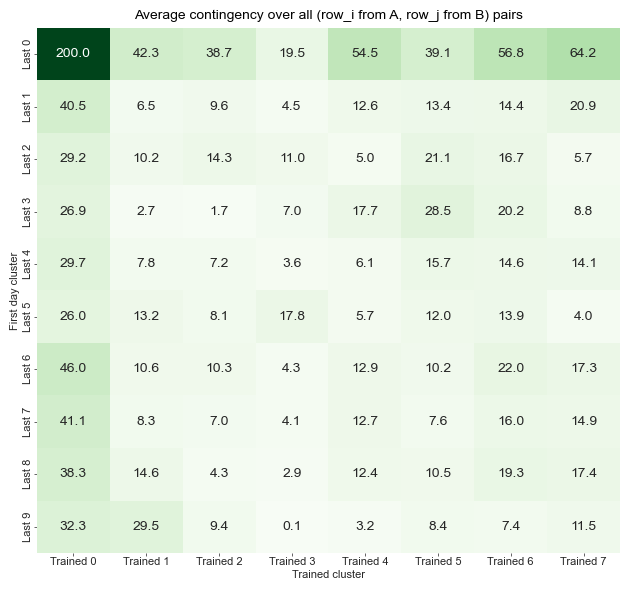

In [33]:
A = longitudinal_firstdaylabels + 1
B = longitudinal_trainedlabels + 1

R, N = A.shape
assert B.shape == (R, N)

# Label cardinalities (assumes labels are non-negative ints, e.g. 0..K-1)
K_A = int(np.max(A)) + 1
K_B = int(np.max(B)) + 1

# Accumulate counts over all row pairs
acc = np.zeros((K_A, K_B), dtype=np.float64)

for i in range(R):
    Ai = A[i].astype(np.int64)
    for j in range(R):
        Bj = B[j].astype(np.int64)
        # linearize pairs (Ai, Bj) into single integers, then bincount
        idx = K_B * Ai + Bj
        counts = np.bincount(idx, minlength=K_A * K_B).reshape(K_A, K_B)  # fixed shape
        acc += counts  # sum counts across all (i, j)
        
# Average over all R*R row-pairs (you can keep 'acc' if you prefer summed counts)
avg_cont = acc / (R * R)

# Optional: also summarise the ARI over all pairs
# (mean ARI is a nice scalar agreement summary across rows)
# NOTE: ARI is defined for 1D labelings. :contentReference[oaicite:1]{index=1}
# mean_ari = np.mean([[adjusted_rand_score(A[i], B[j]) for j in range(R)] for i in range(R)])

# Make a labeled DataFrame for plotting
cont_df = pandas.DataFrame(
    avg_cont,
    index=[f"Last {k}" for k in range(K_A)],
    columns=[f"Trained {k}" for k in range(K_B)]
)

plt.figure(figsize=(max(5, K_B * 0.8), max(4, K_A * 0.6)))
sns.heatmap(cont_df, annot=True, fmt=".1f", cmap="Greens", cbar=False)
plt.title("Average contingency over all (row_i from A, row_j from B) pairs")
plt.xlabel("Trained cluster")
plt.ylabel("First day cluster")
plt.tight_layout()
plt.show()

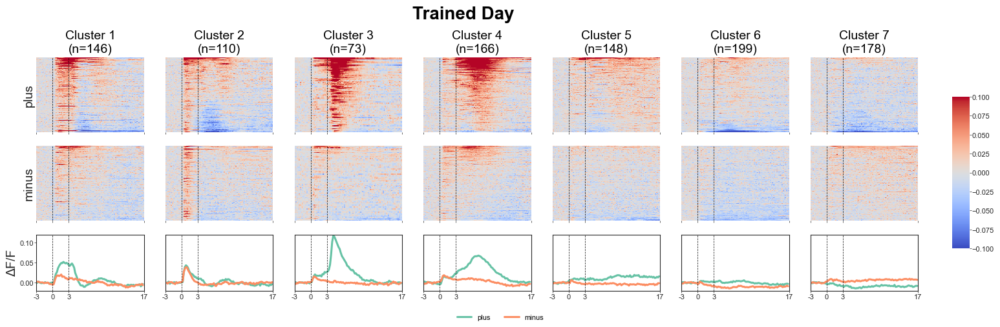

In [21]:
# --- keep text as editable vector in SVGs ---
import matplotlib as mpl
mpl.rcParams['svg.fonttype'] = 'none'

# per cluster plots for each population dataset
# select data to use
align_pop = align_pop_trained
newlabels = longitudinal_trainedlabels[0,:].squeeze()
selecteddata = longitudinaltraineddata
figtitle = "Trained Day"

# ---------------------------------------------------------------------
#  PREP
# ---------------------------------------------------------------------
uniquelabels    = np.unique(newlabels)
clusters        = np.asarray(uniquelabels)              # for brevity
conditions      = list(align_pop.keys())                # preserves order
n_clust, n_cond = len(clusters), len(conditions)
cmax            = 0.10
sortwindow = [15,100]
pre_window_size = 15
frames_to_reward = 15

# colours for PSTHs – as many as conditions
psth_colors = sns.color_palette("Set2", n_colors=n_cond)

# ---------------------------------------------------------------------
#  FIGURE / AXES
# ---------------------------------------------------------------------
base_w, base_h = 2.2, 2.0      # width per column, height per heat-map row  (in inches)
fig_w = base_w * n_clust
fig_h = base_h * n_cond + 0.7   # add ~0.7 in for the PSTH row

fig, axs = plt.subplots(
    n_cond + 1, n_clust-1,
    figsize=(fig_w, fig_h),      # ⇦ bigger canvas
    squeeze=False,
    gridspec_kw={"height_ratios": [1]*n_cond + [0.75]},
    sharex="col"
)
fig.suptitle(figtitle, fontsize=20, weight="bold", y=1.05)

# colour-bar (single instance)
cbar_ax = fig.add_axes([.93, .25, .015, .5])
cbar_ax.tick_params(width=0.5)

# make anything with zorder < 0 rasterize on these axes
for axcol in axs.ravel():
    axcol.set_rasterization_zorder(0)

# keep cluster sizes for the titles
cluster_sizes = np.empty(n_clust, dtype=int)

# ---------------------------------------------------------------------
#  MAIN LOOP
# ---------------------------------------------------------------------
for ci, cluster in enumerate(clusters[1:]):

    # axis that will hold the average traces for this column
    psth_ax = axs[-1, ci]
    psth_ax.grid(False)
    
    for ki, cond in enumerate(conditions):

        # ----------------- DATA SLICE -----------------
        rows      = np.where(newlabels == cluster)[0]
        start     = ki * window_size 
        stop      = start + window_size
        temp      = selecteddata[rows, start:stop]
        cluster_sizes[ci] = temp.shape[0]

        # ordering units for the heat-map
        sorter = np.argsort(np.mean(temp[:, sortwindow[0]:sortwindow[1]], axis=1))[::-1]
        temp   = temp[sorter]

        # ----------------- HEAT-MAP -------------------
        hm_ax = axs[ki, ci]

        hm = sns.heatmap(
            temp, ax=hm_ax,
            cmap="coolwarm", vmin=-cmax, vmax=cmax,
            cbar=(ci == 0), cbar_ax=cbar_ax if ci == 0 else None
        )
        hm_ax.grid(False)
        hm_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
        hm_ax.axvline(pre_window_size+frames_to_reward, ls="--", lw=.5, c="k")

        hm_ax.set_yticks([])
        hm_ax.tick_params(width=.5)

        # Rasterize ONLY the heatmap tiles; keep ticks/text vector
        if hm_ax.collections:
            quad = hm_ax.collections[0]
            quad.set_rasterized(True)
            quad.set_zorder(-10)   # below 0 so it rasterizes

        # x-tick labels only on first heat-map row
        if ki == n_cond - 1:
            # hm_ax.set_xlabel(f"Time from Cue (s)")
            hm_ax.set_xticks([0,
                              pre_window_size,
                              pre_window_size + frames_to_reward,
                              window_size])
            hm_ax.set_xticklabels([
                f"{(a-pre_window_size)/framerate:.0f}"
                for a in [0,
                          pre_window_size,
                          pre_window_size + frames_to_reward,
                          window_size]
            ])
        else:
            hm_ax.set_xticks([])

        # row labels just for first column
        if ci == 0:
            hm_ax.set_ylabel(f"{cond}", fontsize=14)

        # ----------------- PSTH -----------------------
        psth = np.nanmean(temp, axis=0)
        psth_ax.plot(
            psth,
            color=psth_colors[ki],
            lw=2.2,
            label=cond if ci == 0 else None     # legend only once
        )

    # finish PSTH axis styling (once per column)
    psth_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
    psth_ax.axvline(pre_window_size+frames_to_reward, ls="--", lw=.5, c="k")

    psth_ax.set_xlim(0, window_size)
    psth_ax.set_ylim(-0.02, cmax+0.02)
    psth_ax.tick_params(width=.5)
    if ci == 0:
        psth_ax.set_ylabel("ΔF/F", fontsize=14)
    else:
        psth_ax.set_yticks([])

    # column title
    axs[0, ci].set_title(f"Cluster {int(cluster+1)}\n(n={cluster_sizes[ci]})", fontsize=14)

# single legend under the PSTH row
handles, labels = axs[-1, 0].get_legend_handles_labels()
if handles:
    fig.legend(handles, labels, loc="lower center", ncol=n_cond, frameon=False)

# --- Rasterize the colorbar gradient as well (keep ticks/text vector) ---
for artist in list(cbar_ax.collections) + list(cbar_ax.images):
    artist.set_rasterized(True)
    artist.set_zorder(-10)

# ---------------------------------------------------------------------
#  SAVE (SVG smaller) 
# ---------------------------------------------------------------------
out_  = longitudinal_figure_folder + "TR_Clusters_TR_response_heatmaps_and_PSTH.pdf"
# out_svgz = longitudinal_figure_folder + "TR_Clusters_TR_response_heatmaps_and_PSTH.svgz"

# dpi controls the embedded raster resolution; 100–150 is a good balance
fig.savefig(out_,  format="pdf",  bbox_inches="tight", dpi=150)
# fig.savefig(out_svgz, format="svgz", bbox_inches="tight", dpi=120)

plt.show()


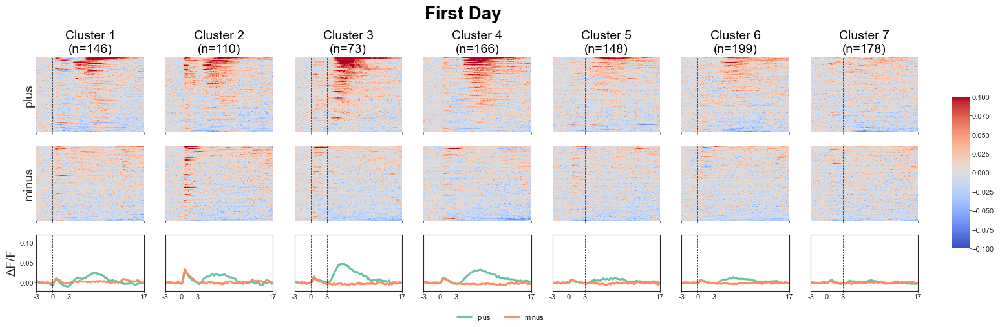

In [22]:
# --- keep text as editable vector in SVGs ---
import matplotlib as mpl
mpl.rcParams['svg.fonttype'] = 'none'

# per cluster plots for each population dataset
# select data to use
align_pop = align_pop_trained
newlabels = longitudinal_trainedlabels[0,:].squeeze()
selecteddata = longitudinalfirstdaydata
figtitle = "First Day"

# ---------------------------------------------------------------------
#  PREP
# ---------------------------------------------------------------------
uniquelabels    = np.unique(newlabels)
clusters        = np.asarray(uniquelabels)              # for brevity
conditions      = list(align_pop.keys())                # preserves order
n_clust, n_cond = len(clusters), len(conditions)
cmax            = 0.10
sortwindow = [15,100]
pre_window_size = 15
frames_to_reward = 15

# colours for PSTHs – as many as conditions
psth_colors = sns.color_palette("Set2", n_colors=n_cond)

# ---------------------------------------------------------------------
#  FIGURE / AXES
# ---------------------------------------------------------------------
base_w, base_h = 2.2, 2.0      # width per column, height per heat-map row  (in inches)
fig_w = base_w * n_clust
fig_h = base_h * n_cond + 0.7   # add ~0.7 in for the PSTH row

fig, axs = plt.subplots(
    n_cond + 1, n_clust-1,
    figsize=(fig_w, fig_h),      # ⇦ bigger canvas
    squeeze=False,
    gridspec_kw={"height_ratios": [1]*n_cond + [0.75]},
    sharex="col"
)
fig.suptitle(figtitle, fontsize=20, weight="bold", y=1.05)

# colour-bar (single instance)
cbar_ax = fig.add_axes([.93, .25, .015, .5])
cbar_ax.tick_params(width=0.5)

# make anything with zorder < 0 rasterize on these axes
for axcol in axs.ravel():
    axcol.set_rasterization_zorder(0)

# keep cluster sizes for the titles
cluster_sizes = np.empty(n_clust, dtype=int)

# ---------------------------------------------------------------------
#  MAIN LOOP
# ---------------------------------------------------------------------
for ci, cluster in enumerate(clusters[1:]):

    # axis that will hold the average traces for this column
    psth_ax = axs[-1, ci]
    psth_ax.grid(False)
    
    for ki, cond in enumerate(conditions):

        # ----------------- DATA SLICE -----------------
        rows      = np.where(newlabels == cluster)[0]
        start     = ki * window_size
        stop      = start + window_size
        temp      = selecteddata[rows, start:stop]
        cluster_sizes[ci] = temp.shape[0]

        # ordering units for the heat-map
        sorter = np.argsort(np.mean(temp[:, sortwindow[0]:sortwindow[1]], axis=1))[::-1]
        temp   = temp[sorter]

        # ----------------- HEAT-MAP -------------------
        hm_ax = axs[ki, ci]

        hm = sns.heatmap(
            temp, ax=hm_ax,
            cmap="coolwarm", vmin=-cmax, vmax=cmax,
            cbar=(ci == 0), cbar_ax=cbar_ax if ci == 0 else None
        )
        hm_ax.grid(False)
        hm_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
        hm_ax.axvline(pre_window_size+frames_to_reward, ls="--", lw=.5, c="k")
        
        hm_ax.set_yticks([])
        hm_ax.tick_params(width=.5)

        # Rasterize ONLY the heatmap tiles; keep ticks/text vector
        if hm_ax.collections:
            quad = hm_ax.collections[0]
            quad.set_rasterized(True)
            quad.set_zorder(-10)   # below 0 so it rasterizes

        # x-tick labels only on first heat-map row
        if ki == n_cond - 1:
            # hm_ax.set_xlabel(f"Time from Cue (s)")
            hm_ax.set_xticks([0,
                              pre_window_size,
                              pre_window_size + frames_to_reward,
                              window_size])
            hm_ax.set_xticklabels([
                f"{(a-pre_window_size)/framerate:.0f}"
                for a in [0,
                          pre_window_size,
                          pre_window_size + frames_to_reward,
                          window_size]
            ])
        else:
            hm_ax.set_xticks([])

        # row labels just for first column
        if ci == 0:
            hm_ax.set_ylabel(f"{cond}", fontsize=14)

        # ----------------- PSTH -----------------------
        psth = np.nanmean(temp, axis=0)
        psth_ax.plot(
            psth,
            color=psth_colors[ki],
            lw=2.2,
            label=cond if ci == 0 else None     # legend only once
        )

    # finish PSTH axis styling (once per column)
    psth_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
    psth_ax.axvline(pre_window_size+frames_to_reward, ls="--", lw=.5, c="k")
    
    psth_ax.set_xlim(0, window_size)
    psth_ax.set_ylim(-0.02, cmax+0.02)
    psth_ax.tick_params(width=.5)
    if ci == 0:
        psth_ax.set_ylabel("ΔF/F", fontsize=14)
    else:
        psth_ax.set_yticks([])

    # column title
    axs[0, ci].set_title(f"Cluster {int(cluster+1)}\n(n={cluster_sizes[ci]})", fontsize=14)

# single legend under the PSTH row
handles, labels = axs[-1, 0].get_legend_handles_labels()
if handles:
    fig.legend(handles, labels, loc="lower center", ncol=n_cond, frameon=False)

# --- Rasterize the colorbar gradient as well (keep ticks/text vector) ---
for artist in list(cbar_ax.collections) + list(cbar_ax.images):
    artist.set_rasterized(True)
    artist.set_zorder(-10)

# ---------------------------------------------------------------------
#  SAVE (SVG smaller) 
# ---------------------------------------------------------------------
out_  = longitudinal_figure_folder + "TR_Clusters_FD_response_heatmaps_and_PSTH.pdf"
# out_svgz = longitudinal_figure_folder + "TR_Clusters_FD_response_heatmaps_and_PSTH.svgz"

# dpi controls the embedded raster resolution; 100–150 is a good balance
fig.savefig(out_,  format="pdf",  bbox_inches="tight", dpi=150)
# fig.savefig(out_svgz, format="svgz", bbox_inches="tight", dpi=120)

plt.show()


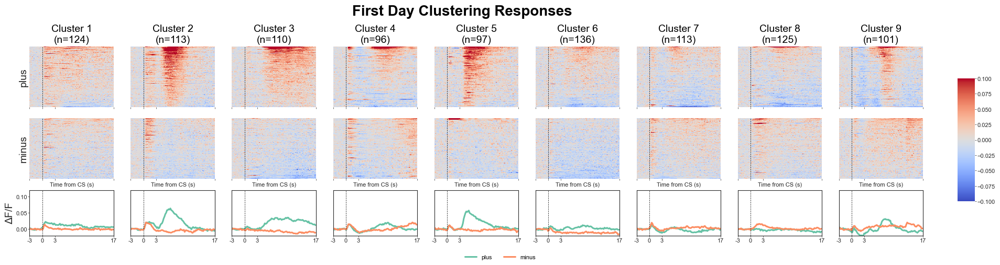

In [50]:
# --- keep text as editable vector in SVGs ---
import matplotlib as mpl                         # <<< ADD
mpl.rcParams['svg.fonttype'] = 'none'            # <<< ADD

# per cluster plots for each population dataset
# select data to use
align_pop = align_pop_firstday
newlabels = longitudinal_firstdaylabels[0,:].squeeze()
selecteddata = longitudinalfirstdaydata
figtitle = "First Day Clustering Responses"

# ---------------------------------------------------------------------
#  PREP
# ---------------------------------------------------------------------
uniquelabels    = np.unique(newlabels)
clusters        = np.asarray(uniquelabels)              # for brevity
conditions      = list(align_pop.keys())                # preserves order
n_clust, n_cond = len(clusters), len(conditions)
cmax            = 0.10

# colours for PSTHs – as many as conditions
psth_colors = sns.color_palette("Set2", n_colors=n_cond)

# ---------------------------------------------------------------------
#  FIGURE / AXES
# ---------------------------------------------------------------------
base_w, base_h = 2.2, 2.0
fig_w = base_w * n_clust
fig_h = base_h * n_cond + 0.7

fig, axs = plt.subplots(
    n_cond + 1, n_clust-1,
    figsize=(fig_w, fig_h),
    squeeze=False,
    gridspec_kw={"height_ratios": [1]*n_cond + [0.75]},
    sharex="col"
)
fig.suptitle(figtitle, fontsize=20, weight="bold", y=1.05)

# colour-bar (single instance)
cbar_ax = fig.add_axes([.93, .25, .015, .5])
cbar_ax.tick_params(width=0.5)

# make anything with zorder < 0 rasterize on this axes     # <<< ADD
for axcol in axs.ravel():                                   # <<< ADD
    axcol.set_rasterization_zorder(0)                       # <<< ADD

# keep cluster sizes for the titles
cluster_sizes = np.empty(n_clust, dtype=int)

# ---------------------------------------------------------------------
#  MAIN LOOP
# ---------------------------------------------------------------------
for ci, cluster in enumerate(clusters[1:]):

    psth_ax = axs[-1, ci]
    psth_ax.grid(False)
    
    for ki, cond in enumerate(conditions):

        # ----------------- DATA SLICE -----------------
        rows      = np.where(newlabels == cluster)[0]
        start     = ki * window_size
        stop      = start + window_size
        temp      = selecteddata[rows, start:stop]
        cluster_sizes[ci] = temp.shape[0]

        sorter = np.argsort(np.mean(temp[:, sortwindow[0]:sortwindow[1]], axis=1))[::-1]
        temp   = temp[sorter]

        # ----------------- HEAT-MAP -------------------
        hm_ax = axs[ki, ci]
        hm = sns.heatmap(
            temp, ax=hm_ax,
            cmap="coolwarm", vmin=-cmax, vmax=cmax,
            cbar=(ci == 0), cbar_ax=cbar_ax if ci == 0 else None
        )
        hm_ax.grid(False)
        hm_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
        hm_ax.set_yticks([])
        hm_ax.tick_params(width=.5)

        # >>> Rasterize ONLY the heatmap (keeps labels/ticks vector)   <<< ADD
        # seaborn returns a QuadMesh in ax.collections[0]
        if hm_ax.collections:
            quad = hm_ax.collections[0]
            quad.set_rasterized(True)
            quad.set_zorder(-10)   # below 0 so it rasterizes

        # x-tick labels only on first heat-map row
        if ki == n_cond - 1:
            hm_ax.set_xlabel(f"Time from {pre_label} (s)")
            hm_ax.set_xticks([0,
                              pre_window_size,
                              pre_window_size + frames_to_reward,
                              window_size])
            hm_ax.set_xticklabels([
                f"{(a-pre_window_size)/framerate:.0f}"
                for a in [0,
                          pre_window_size,
                          pre_window_size + frames_to_reward,
                          window_size]
            ])
        else:
            hm_ax.set_xticks([])

        # row labels just for first column
        if ci == 0:
            hm_ax.set_ylabel(f"{cond}", fontsize=14)

        # ----------------- PSTH -----------------------
        psth = np.nanmean(temp, axis=0)
        psth_ax.plot(
            psth,
            color=psth_colors[ki],
            lw=2.2,
            label=cond if ci == 0 else None
        )

    # finish PSTH axis styling
    psth_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
    psth_ax.set_xlim(0, window_size)
    psth_ax.set_ylim(-0.02, cmax+0.02)
    psth_ax.tick_params(width=.5)
    if ci == 0:
        psth_ax.set_ylabel("ΔF/F", fontsize=14)
    else:
        psth_ax.set_yticks([])

    axs[0, ci].set_title(f"Cluster {int(cluster+1)}\n(n={cluster_sizes[ci]})", fontsize=14)

# single legend under the PSTH row
handles, labels = axs[-1, 0].get_legend_handles_labels()
if handles:
    fig.legend(handles, labels, loc="lower center", ncol=n_cond, frameon=False)

# --- Rasterize the colorbar gradient as well (keeps ticks/text vector) ---  <<< ADD
for artist in list(cbar_ax.collections) + list(cbar_ax.images):          # <<< ADD
    artist.set_rasterized(True)                                          # <<< ADD
    artist.set_zorder(-10)                                               # <<< ADD

# ---------------------------------------------------------------------
#  SAVE (SVG smaller) 
# ---------------------------------------------------------------------
out_svg  = longitudinal_figure_folder + "FD_Clusters_FD_response_heatmaps_and_PSTH.svg"
out_svgz = longitudinal_figure_folder + "FD_Clusters_FD_response_heatmaps_and_PSTH.svgz"

# dpi controls the embedded raster resolution; 100–150 is a good balance
fig.savefig(out_svg,  format="svg",  bbox_inches="tight", dpi=120)        # <<< ADD
fig.savefig(out_svgz, format="svgz", bbox_inches="tight", dpi=120)        # <<< ADD

# (optional) display in notebook
plt.show()


### (FIG3) Cluster PSTHs across days

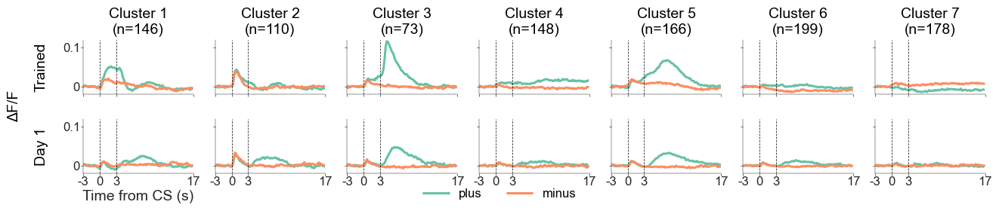

In [34]:
# --- keep text as editable vectors in SVGs ---
import matplotlib as mpl
mpl.rcParams['svg.fonttype'] = 'none'

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mticker  # <-- NEW

# ========= Assumes these already exist in your session =========
# align_pop_trained, align_pop_firstday
# longitudinal_trainedlabels, longitudinal_firstdaylabels
# longitudinaltraineddata, longitudinalfirstdaydata
# window_size, pre_window_size, frames_to_reward, framerate, pre_label
# ===============================================================

LINEWIDTH = 2.2
AXIS_LABEL_FONTSIZE = 14
TITLE_FONTSIZE      = 14
TICK_FONTSIZE       = 12
cmax                = 0.10

# >>> NEW SPACING KNOBS <<<
HSPACE       = 0.45   # vertical gap between the top & bottom rows
LEFT_RECT    = 0.14   # increase left margin for more room left of first plot
ROWLABEL_PAD = 0.030  # distance from left edge to row labels "Trained"/"Day 1"

conditions = list(align_pop_trained.keys())
n_cond = len(conditions)
psth_colors = sns.color_palette("Set2", n_colors=n_cond)

tr_labels = np.asarray(longitudinal_trainedlabels[0, :]).squeeze()
clusters  = np.unique(tr_labels)
clusters  = clusters[1:]
ncols     = len(clusters)
if ncols == 0:
    raise ValueError("No clusters found after skipping the first label.")

def cluster_psths(data_2d, rows_idx, window_size):
    psths = []
    for ki in range(n_cond):
        start = ki * window_size
        stop  = start + window_size
        seg = data_2d[rows_idx, start:stop] if rows_idx.size else np.empty((0, window_size))
        psths.append(np.nanmean(seg, axis=0) if seg.size else np.zeros(window_size))
    return psths

base_w = 2.2
psth_row_h = 0.95
fig_w = base_w * ncols
fig_h = psth_row_h * 2 + 0.4

# >>> add hspace to widen the gap between rows <<<
fig, axs = plt.subplots(2, ncols, figsize=(fig_w, fig_h),
                        sharex=True, sharey=True,
                        gridspec_kw={'hspace': HSPACE})  # <<<
if ncols == 1:
    axs = np.array([[axs[0]], [axs[1]]])

ax_top = axs[0]
ax_bot = axs[1]

x = np.arange(window_size)
xticks = [0, pre_window_size, pre_window_size + frames_to_reward, window_size]
xticklabels = [f"{(a - pre_window_size)/framerate:.0f}" for a in xticks]

# TOP row (Trained)
for ci, cl in enumerate(clusters):
    ax = ax_top[ci]
    rows = np.where(tr_labels == cl)[0]
    psths = cluster_psths(longitudinaltraineddata, rows, window_size)
    for ki in range(n_cond):
        ax.plot(x, psths[ki], color=psth_colors[ki], lw=LINEWIDTH)
    ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
    ax.axvline(pre_window_size + frames_to_reward, ls="--", lw=.5, c="k")
    ax.set_xlim(0, window_size)
    ax.tick_params(width=.5, labelsize=TICK_FONTSIZE)
    ax.set_title(f"Cluster {int(cl+1)}\n(n={rows.size})", fontsize=TITLE_FONTSIZE)
    for s in ("top", "right"): ax.spines[s].set_visible(False)
    for s in ("bottom", "left"): ax.spines[s].set_linewidth(0.35)

# BOTTOM row (First Day, TR clustering)
for ci, cl in enumerate(clusters):
    ax = ax_bot[ci]
    rows = np.where(tr_labels == cl)[0]
    psths = cluster_psths(longitudinalfirstdaydata, rows, window_size)
    for ki in range(n_cond):
        ax.plot(x, psths[ki], color=psth_colors[ki], lw=LINEWIDTH)
    ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
    ax.axvline(pre_window_size + frames_to_reward, ls="--", lw=.5, c="k")
    ax.set_xlim(0, window_size)
    ax.tick_params(width=.5, labelsize=TICK_FONTSIZE)
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels, fontsize=TICK_FONTSIZE)
    if ci == 0:
        ax.set_xlabel(f"Time from {pre_label} (s)", fontsize=AXIS_LABEL_FONTSIZE)
    for s in ("top", "right"): ax.spines[s].set_visible(False)
    for s in ("bottom", "left"): ax.spines[s].set_linewidth(0.35)

# ===== Shared y: fixed ticks AND visible labels =====
yticks = [0.0, 0.1]
for ax in axs.ravel():
    ax.set_ylim(-0.02, 0.12)
    ax.yaxis.set_major_locator(mticker.FixedLocator(yticks))
    ax.yaxis.set_major_formatter(mticker.FixedFormatter(['0','0.1']))

# show tick labels on LEFT column; hide elsewhere to declutter
for row_axes in axs:
    for j, ax in enumerate(row_axes):
        ax.tick_params(axis='y', labelsize=TICK_FONTSIZE, labelleft=(j == 0))

# >>> Increase left margin so plots sit further right <<<
plt.tight_layout(rect=[LEFT_RECT, 0.06, 0.98, 0.98])  # left, bottom, right, top

# --- Place shared y-label and row labels AFTER layout is finalized ---
fig.canvas.draw()

# Left edge of the first column (figure coords)
left_edge = min(ax_top[0].get_position().x0, ax_bot[0].get_position().x0)

# Shared y-label: push further left by SUPY_PAD from left_edge
SUPY_PAD     = 0.06  # distance from left edge to shared y-label (bigger -> further left)

fig.supylabel("ΔF/F", fontsize=AXIS_LABEL_FONTSIZE, x=SUPY_PAD)

# Row labels "Trained" and "Day 1": push further left by ROWLABEL_PAD from left_edge
pos_top = ax_top[0].get_position()
pos_bot = ax_bot[0].get_position()
y_mid_top = 0.5 * (pos_top.y0 + pos_top.y1)
y_mid_bot = 0.5 * (pos_bot.y0 + pos_bot.y1)

fig.text(left_edge - ROWLABEL_PAD, y_mid_top, "Trained",
         rotation=90, va="center", ha="right", fontsize=AXIS_LABEL_FONTSIZE)
fig.text(left_edge - ROWLABEL_PAD, y_mid_bot, "Day 1",
         rotation=90, va="center", ha="right", fontsize=AXIS_LABEL_FONTSIZE)

# Legend (conditions) centered below
handles, labels = [], []
for ki, cond in enumerate(conditions):
    h, = ax_top[0].plot([], [], color=psth_colors[ki], lw=LINEWIDTH, label=cond)
    handles.append(h); labels.append(cond)
fig.legend(handles, labels, loc="lower center", ncol=n_cond, frameon=False, fontsize=TICK_FONTSIZE)

# # Optional: save as SVG
# fig.savefig(longitudinal_figure_folder + "FIG3_longitudinal_day1_and_trained_PSTHs_pertrialtype.svg", format="svg", dpi=150, bbox_inches="tight")

plt.show()


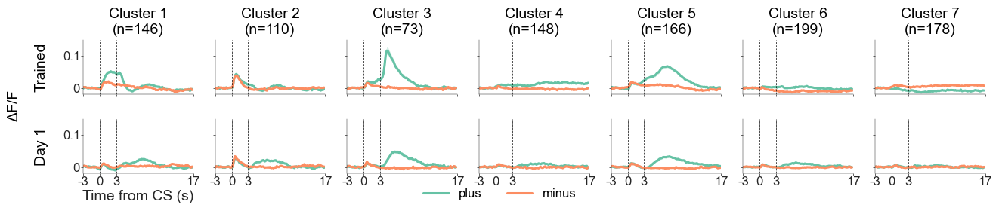

In [37]:
# --- keep text as editable vectors in SVGs ---
import matplotlib as mpl
mpl.rcParams['svg.fonttype'] = 'none'

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mticker  # <-- NEW

# ========= Assumes these already exist in your session =========
# align_pop_trained, align_pop_firstday
# longitudinal_trainedlabels, longitudinal_firstdaylabels
# longitudinaltraineddata, longitudinalfirstdaydata
# window_size, pre_window_size, frames_to_reward, framerate, pre_label
# ===============================================================

LINEWIDTH = 2.2
AXIS_LABEL_FONTSIZE = 14
TITLE_FONTSIZE      = 14
TICK_FONTSIZE       = 12
cmax                = 0.10

fill_between = True

# >>> NEW SPACING KNOBS <<<
HSPACE       = 0.45   # vertical gap between the top & bottom rows
LEFT_RECT    = 0.14   # increase left margin for more room left of first plot
ROWLABEL_PAD = 0.030  # distance from left edge to row labels "Trained"/"Day 1"

conditions = list(align_pop_trained.keys())
n_cond = len(conditions)
psth_colors = sns.color_palette("Set2", n_colors=n_cond)

tr_labels = np.asarray(longitudinal_trainedlabels[0, :]).squeeze()
clusters  = np.unique(tr_labels)
clusters  = clusters[1:]
ncols     = len(clusters)
if ncols == 0:
    raise ValueError("No clusters found after skipping the first label.")

# --- CHANGED: return mean and SEM per condition for a cluster ---
def cluster_psths(data_2d, rows_idx, window_size):
    means, sems = [], []
    for ki in range(n_cond):
        start = ki * window_size
        stop  = start + window_size
        seg = data_2d[rows_idx, start:stop] if rows_idx.size else np.empty((0, window_size))
        if seg.size:
            m = np.nanmean(seg, axis=0)
            # SEM per time bin, robust to NaNs
            n_valid = np.sum(~np.isnan(seg), axis=0)
            sd = np.nanstd(seg, axis=0, ddof=1)
            se = sd / np.sqrt(np.maximum(n_valid, 1))
            se = np.nan_to_num(se, nan=0.0, posinf=0.0, neginf=0.0)
        else:
            m = np.zeros(window_size)
            se = np.zeros(window_size)
        means.append(m)
        sems.append(se)
    return means, sems

base_w = 2.2
psth_row_h = 0.95
fig_w = base_w * ncols
fig_h = psth_row_h * 2 + 0.4

# >>> add hspace to widen the gap between rows <<<
fig, axs = plt.subplots(2, ncols, figsize=(fig_w, fig_h),
                        sharex=True, sharey=True,
                        gridspec_kw={'hspace': HSPACE})  # <<<
if ncols == 1:
    axs = np.array([[axs[0]], [axs[1]]])

ax_top = axs[0]
ax_bot = axs[1]

x = np.arange(window_size)
xticks = [0, pre_window_size, pre_window_size + frames_to_reward, window_size]
xticklabels = [f"{(a - pre_window_size)/framerate:.0f}" for a in xticks]

# TOP row (Trained)
for ci, cl in enumerate(clusters):
    ax = ax_top[ci]
    rows = np.where(tr_labels == cl)[0]
    means, sems = cluster_psths(longitudinaltraineddata, rows, window_size)
    for ki in range(n_cond):
        if fill_between:
            m, se = means[ki], sems[ki]
            # --- NEW: shaded SEM band (same color, semi-transparent) ---
            ax.fill_between(x, m - se, m + se,
                            color=psth_colors[ki], alpha=0.25, linewidth=0, zorder=1)
        ax.plot(x, m, color=psth_colors[ki], lw=LINEWIDTH, zorder=2)
    ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
    ax.axvline(pre_window_size + frames_to_reward, ls="--", lw=.5, c="k")
    ax.set_xlim(0, window_size)
    ax.tick_params(width=.5, labelsize=TICK_FONTSIZE)
    ax.set_title(f"Cluster {int(cl+1)}\n(n={rows.size})", fontsize=TITLE_FONTSIZE)
    for s in ("top", "right"): ax.spines[s].set_visible(False)
    for s in ("bottom", "left"): ax.spines[s].set_linewidth(0.35)

# BOTTOM row (First Day, TR clustering)
for ci, cl in enumerate(clusters):
    ax = ax_bot[ci]
    rows = np.where(tr_labels == cl)[0]
    means, sems = cluster_psths(longitudinalfirstdaydata, rows, window_size)
    for ki in range(n_cond):
        if fill_between:
            # --- NEW: shaded SEM band (same color, semi-transparent) ---
            m, se = means[ki], sems[ki]
            ax.fill_between(x, m - se, m + se,
                            color=psth_colors[ki], alpha=0.25, linewidth=0, zorder=1)
        ax.plot(x, m, color=psth_colors[ki], lw=LINEWIDTH, zorder=2)
    ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
    ax.axvline(pre_window_size + frames_to_reward, ls="--", lw=.5, c="k")
    ax.set_xlim(0, window_size)
    ax.tick_params(width=.5, labelsize=TICK_FONTSIZE)
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels, fontsize=TICK_FONTSIZE)
    if ci == 0:
        ax.set_xlabel(f"Time from {pre_label} (s)", fontsize=AXIS_LABEL_FONTSIZE)
    for s in ("top", "right"): ax.spines[s].set_visible(False)
    for s in ("bottom", "left"): ax.spines[s].set_linewidth(0.35)

# ===== Shared y: fixed ticks AND visible labels =====
yticks = [0.0, 0.1]
for ax in axs.ravel():
    ax.set_ylim(-0.02, 0.15)
    ax.yaxis.set_major_locator(mticker.FixedLocator(yticks))
    ax.yaxis.set_major_formatter(mticker.FixedFormatter(['0','0.1']))

# show tick labels on LEFT column; hide elsewhere to declutter
for row_axes in axs:
    for j, ax in enumerate(row_axes):
        ax.tick_params(axis='y', labelsize=TICK_FONTSIZE, labelleft=(j == 0))

# >>> Increase left margin so plots sit further right <<<
plt.tight_layout(rect=[LEFT_RECT, 0.06, 0.98, 0.98])  # left, bottom, right, top

# --- Place shared y-label and row labels AFTER layout is finalized ---
fig.canvas.draw()

# Left edge of the first column (figure coords)
left_edge = min(ax_top[0].get_position().x0, ax_bot[0].get_position().x0)

# Shared y-label
SUPY_PAD = 0.06
fig.supylabel("ΔF/F", fontsize=AXIS_LABEL_FONTSIZE, x=SUPY_PAD)

# Row labels "Trained" and "Day 1"
pos_top = ax_top[0].get_position()
pos_bot = ax_bot[0].get_position()
y_mid_top = 0.5 * (pos_top.y0 + pos_top.y1)
y_mid_bot = 0.5 * (pos_bot.y0 + pos_bot.y1)

fig.text(left_edge - ROWLABEL_PAD, y_mid_top, "Trained",
         rotation=90, va="center", ha="right", fontsize=AXIS_LABEL_FONTSIZE)
fig.text(left_edge - ROWLABEL_PAD, y_mid_bot, "Day 1",
         rotation=90, va="center", ha="right", fontsize=AXIS_LABEL_FONTSIZE)

# Legend (conditions) centered below
handles, labels = [], []
for ki, cond in enumerate(conditions):
    h, = ax_top[0].plot([], [], color=psth_colors[ki], lw=LINEWIDTH, label=cond)
    handles.append(h); labels.append(cond)
fig.legend(handles, labels, loc="lower center", ncol=n_cond, frameon=False, fontsize=TICK_FONTSIZE)

# # Optional: save as SVG
fig.savefig(longitudinal_figure_folder + "FIG3_longitudinal_day1_and_trained_PSTHs_pertrialtype.svg", format="svg", dpi=150, bbox_inches="tight")

plt.show()


### (FIG3) CS+ Sequence

In [23]:
align_pop = align_pop_trained
newlabels = longitudinal_trainedlabels[0,:].squeeze() # USING 0th ITERATION OF CLUSTER LABELS
selecteddata = longitudinaltraineddata

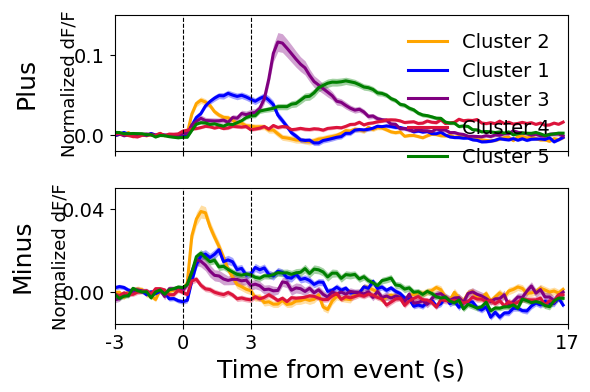

NameError: name 'replay_figure_folder' is not defined

In [34]:
# --- keep text as editable vector in SVGs ---
import matplotlib as mpl
mpl.rcParams['svg.fonttype'] = 'none'

import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Standalone figure: PSTHs for clusters 2, 1, 3, and 5
# - Two stacked panels: TOP = PLUS PSTHs, BOTTOM = MINUS PSTHs
# - Each panel overlays clusters 2,1,3,5 with colors:
#     2→orange, 1→blue, 3→purple, 5→green
# - y-label on each panel indicates "Plus"/"Minus"
# - Additional small vertical label between y-axis and main label: "Normalized dF/F"
# - Vertical lines (axvline) at the same positions as in your previous figure:
#     pre_window_size  (and pre_window_size + frames_to_reward if defined)
# - Shaded bands = ±1 SEM around each PSTH line (fill_between)
# - NEW: Force SAME y-limits and y-ticks on both panels
#
# Requirements from session:
#   newlabels, selecteddata, window_size, pre_window_size, framerate
#   conditions = list(align_pop.keys())  should include 'plus' and 'minus' (case-insensitive ok)
# ============================================================

# ---------- Safe defaults (used only if not already defined in your session) ----------
axis_fontsize = 18
tick_fontsize = 14

# ---------- Helper: find condition index by name (case-insensitive, substring ok) ----------
def _find_cond_idx(conditions, key):
    key_l = key.lower()
    # exact case-insensitive
    for i, c in enumerate(conditions):
        if c.lower() == key_l:
            return i
    # substring fallback
    for i, c in enumerate(conditions):
        if key_l in c.lower():
            return i
    raise ValueError(f"Could not find condition named like '{key}' in conditions={conditions}")

# ---------- Pull indices for PLUS and MINUS windows ----------
conditions = list(align_pop.keys())  # from your session
idx_plus  = _find_cond_idx(conditions, 'plus')
idx_minus = _find_cond_idx(conditions, 'minus')

# ---------- Cluster selection (1-based labels as shown in your figs) ----------
clusters_1based = [2, 1, 3, 4, 5]
# Map to colors in the user-specified order
color_map = {2: 'orange', 1: 'blue', 3: 'purple', 4: 'crimson', 5: 'green'}

# ---------- Build time axis (in seconds) for labeling ----------
time_frames = np.arange(window_size)
def _frames_to_seconds(frames):
    return (np.asarray(frames) - pre_window_size) / float(framerate)

# ---------- Gather vertical line positions ----------
event_positions = [pre_window_size]
if 'frames_to_reward' in globals():
    event_positions.append(pre_window_size + int(frames_to_reward))

# ---------- Create the figure ----------
fig, (ax_plus, ax_minus) = plt.subplots(
    2, 1, figsize=(6, 4), sharex=True, constrained_layout=False
)

# ---------- Plot PSTHs for each selected cluster ----------
handles = []
labels  = []

for cid in clusters_1based:
    # Infer the underlying label value used in your arrays (0-based in prior code)
    label_val = cid - 1

    rows = np.where(newlabels == label_val)[0]
    if rows.size == 0:
        continue

    # Slice windows for plus/minus
    start_plus  = idx_plus  * window_size
    stop_plus   = start_plus + window_size
    start_minus = idx_minus * window_size
    stop_minus  = start_minus + window_size

    data_plus  = selecteddata[rows, start_plus:stop_plus]
    data_minus = selecteddata[rows, start_minus:stop_minus]

    # Mean and SEM across units
    psth_plus   = np.nanmean(data_plus,  axis=0)
    psth_minus  = np.nanmean(data_minus, axis=0)
    sem_plus    = (np.nanstd(data_plus,  axis=0, ddof=1) / np.sqrt(max(1, rows.size))) if rows.size > 1 else np.zeros_like(psth_plus)
    sem_minus   = (np.nanstd(data_minus, axis=0, ddof=1) / np.sqrt(max(1, rows.size))) if rows.size > 1 else np.zeros_like(psth_minus)

    color = color_map[cid]

    # Shaded ±1 SEM bands (under the line)
    ax_plus.fill_between(
        time_frames, psth_plus - sem_plus, psth_plus + sem_plus,
        color=color, alpha=0.36, linewidth=0, zorder=1
    )
    ax_minus.fill_between(
        time_frames, psth_minus - sem_minus, psth_minus + sem_minus,
        color=color, alpha=0.36, linewidth=0, zorder=1
    )

    # Lines on top
    h_plus,  = ax_plus.plot(psth_plus,  color=color, lw=2.2, zorder=2)
    h_minus, = ax_minus.plot(psth_minus, color=color, lw=2.2, zorder=2)

    # Shared legend (use top axis)
    handles.append(h_plus)
    labels.append(f"Cluster {cid}")

# ---------- Axes styling ----------
# Vertical lines at event positions
for xline in event_positions:
    ax_plus.axvline(xline,  ls="--", lw=.8, c="k")
    ax_minus.axvline(xline, ls="--", lw=.8, c="k")

# X ticks at [0, pre, pre+reward (optional), window_size] with seconds labels
xticks = [0, pre_window_size, window_size]
if len(event_positions) > 1:
    xticks = [0, pre_window_size, event_positions[1], window_size]
ax_minus.set_xticks(xticks)
ax_minus.set_xticklabels([f"{t:.0f}" for t in _frames_to_seconds(xticks)])

# Limits (x)
ax_plus.set_xlim(0, window_size)
ax_minus.set_xlim(0, window_size)

# -------- SAME y-limits and y-ticks on both panels --------
# First, let Matplotlib compute autos, then unify:
def _pad_ylim(ax, pad=0.02):
    ymin, ymax = ax.get_ylim()
    rng = ymax - ymin if ymax > ymin else 1.0
    return ymin - pad*rng, ymax + pad*rng

y0_plus, y1_plus   = _pad_ylim(ax_plus,  pad=0.04)
y0_minus, y1_minus = _pad_ylim(ax_minus, pad=0.04)

ax_plus.set_ylim(-0.02, 0.15)
ax_minus.set_ylim(-0.015, 0.05)
ax_plus.set_yticks([0,0.1])
ax_minus.set_yticks([0,0.04])

# Labels & tick params
ax_plus.tick_params(labelsize=tick_fontsize)
ax_minus.tick_params(labelsize=tick_fontsize)
ax_minus.set_xlabel(f"Time from event (s)", fontsize=axis_fontsize)

# Main y-axis labels: Plus / Minus
ax_plus.set_ylabel("Plus",  fontsize=axis_fontsize, labelpad=26)
ax_minus.set_ylabel("Minus", fontsize=axis_fontsize, labelpad=20)

# Small vertical "Normalized dF/F" BETWEEN the y-axis and the main label
x_locs = [-0.08, -0.1]
for idx, ax in enumerate((ax_plus, ax_minus)):
    ax.text(
        x_locs[idx], 0.5, "Normalized dF/F",
        transform=ax.transAxes, rotation=90,
        va='center', ha='right',
        fontsize=max(10, tick_fontsize - 1),
        color='black', clip_on=False
    )

# Legend (top axis)
if handles:
    ax_plus.legend(handles, labels, frameon=False, loc="upper right", fontsize=tick_fontsize)

# Tighten layout and show
plt.tight_layout()
plt.show()

out_svg  = replay_figure_folder + "Trained_PSTH_Sequence.svg"

# dpi controls the embedded raster resolution; 100–150 is a good balance
fig.savefig(out_svg,  format="svg",  bbox_inches="tight", dpi=120)


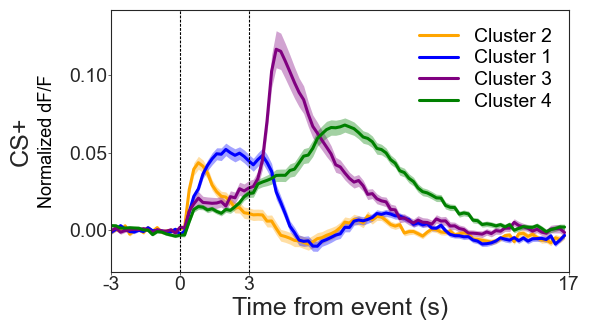

In [30]:
# --- keep text as editable vector in SVGs ---
import matplotlib as mpl
mpl.rcParams['svg.fonttype'] = 'none'

import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Standalone figure: CS+ (Plus) PSTHs for clusters 2, 1, 3, and 5
# - Single panel containing overlaid PSTHs for the 4 clusters
# - Colors: 2→orange, 1→blue, 3→purple, 5→green
# - Shaded bands = ±1 SEM around each PSTH line (fill_between)
# - Vertical lines at pre_window_size and (optionally) pre_window_size+frames_to_reward
#
# Requirements from session:
#   newlabels, selecteddata, window_size, pre_window_size, framerate
#   conditions = list(align_pop.keys())  should include 'plus' (case-insensitive ok)
# ============================================================

# ---------- Safe defaults (used only if not already defined in your session) ----------
axis_fontsize = 18
tick_fontsize = 14

# ---------- Helper: find condition index by name (case-insensitive, substring ok) ----------
def _find_cond_idx(conditions, key):
    key_l = key.lower()
    for i, c in enumerate(conditions):
        if c.lower() == key_l:
            return i
    for i, c in enumerate(conditions):
        if key_l in c.lower():
            return i
    raise ValueError(f"Could not find condition named like '{key}' in conditions={conditions}")

# ---------- Pull index for CS+ / Plus window ----------
conditions = list(align_pop.keys())  # from your session
idx_plus  = _find_cond_idx(conditions, 'plus')

# ---------- Cluster selection (1-based labels as shown in your figs) ----------
clusters_1based = [2, 1, 3, 4]
color_map = {2: 'orange', 1: 'blue', 3: 'purple', 4: 'green', 5: 'crimson'}

# ---------- Build time axis (in seconds) for labeling ----------
time_frames = np.arange(window_size)
def _frames_to_seconds(frames):
    return (np.asarray(frames) - pre_window_size) / float(framerate)

# ---------- Vertical line positions ----------
event_positions = [pre_window_size]
if 'frames_to_reward' in globals():
    event_positions.append(pre_window_size + int(frames_to_reward))

# ---------- Create the figure ----------
fig, ax = plt.subplots(1, 1, figsize=(6, 3.4), constrained_layout=False)

handles, labels = [], []

# ---------- Plot PSTHs for each selected cluster (CS+ only) ----------
for cid in clusters_1based:
    label_val = cid - 1
    rows = np.where(newlabels == label_val)[0]
    if rows.size == 0:
        continue

    start_plus  = idx_plus  * window_size
    stop_plus   = start_plus + window_size
    data_plus   = selecteddata[rows, start_plus:stop_plus]

    # Mean and SEM across units
    psth_plus   = np.nanmean(data_plus, axis=0)
    sem_plus    = (np.nanstd(data_plus, axis=0, ddof=1) / np.sqrt(max(1, rows.size))) if rows.size > 1 else np.zeros_like(psth_plus)

    color = color_map[cid]

    # Shaded ±1 SEM band
    ax.fill_between(
        time_frames, psth_plus - sem_plus, psth_plus + sem_plus,
        color=color, alpha=0.36, linewidth=0, zorder=1
    )

    # Mean line on top
    h, = ax.plot(psth_plus, color=color, lw=2.2, zorder=2, label=f"Cluster {cid}")
    handles.append(h)
    labels.append(f"Cluster {cid}")

# ---------- Axes styling ----------
# Vertical lines at event positions
for xline in event_positions:
    ax.axvline(xline, ls="--", lw=.8, c="k")

# X ticks at [0, pre, pre+reward (optional), window_size] with seconds labels
xticks = [0, pre_window_size, window_size]
if len(event_positions) > 1:
    xticks = [0, pre_window_size, event_positions[1], window_size] # 50 / 7 seconds
ax.set_xticks(xticks)
ax.set_xticklabels([f"{t:.0f}" for t in _frames_to_seconds(xticks)])

# Limits
ax.set_xlim(0, window_size)

# Auto y-lims with a small headroom
def _pad_ylim(ax, pad=0.04):
    ymin, ymax = ax.get_ylim()
    rng = ymax - ymin if ymax > ymin else 1.0
    ax.set_ylim(ymin - pad*rng, ymax + pad*rng)
_pad_ylim(ax, pad=0.04)

# Labels & ticks
ax.tick_params(labelsize=tick_fontsize)
ax.set_xlabel("Time from event (s)", fontsize=axis_fontsize)
ax.set_ylabel("CS+", fontsize=axis_fontsize, labelpad=26)

# Small vertical "Normalized dF/F" BETWEEN the y-axis and the main label
ax.text(
    -0.12, 0.5, "Normalized dF/F",
    transform=ax.transAxes, rotation=90,
    va='center', ha='right',
    fontsize=max(10, tick_fontsize - 1),
    color='black', clip_on=False
)

# Legend
if handles:
    ax.legend(handles, labels, frameon=False, loc="upper right", fontsize=tick_fontsize)

# Finish
plt.tight_layout()
plt.show()

# Optional save (only if you have this variable defined in your session)
fig.savefig(replay_figure_folder + "Trained_PSTH_Sequece_CSplus.svg", format="svg", bbox_inches="tight", dpi=120)
fig.savefig(replay_figure_folder + "Trained_PSTH_Sequece_CSplus.pdf", format="pdf", bbox_inches="tight", dpi=120)


### (FIG3) Heatmaps 

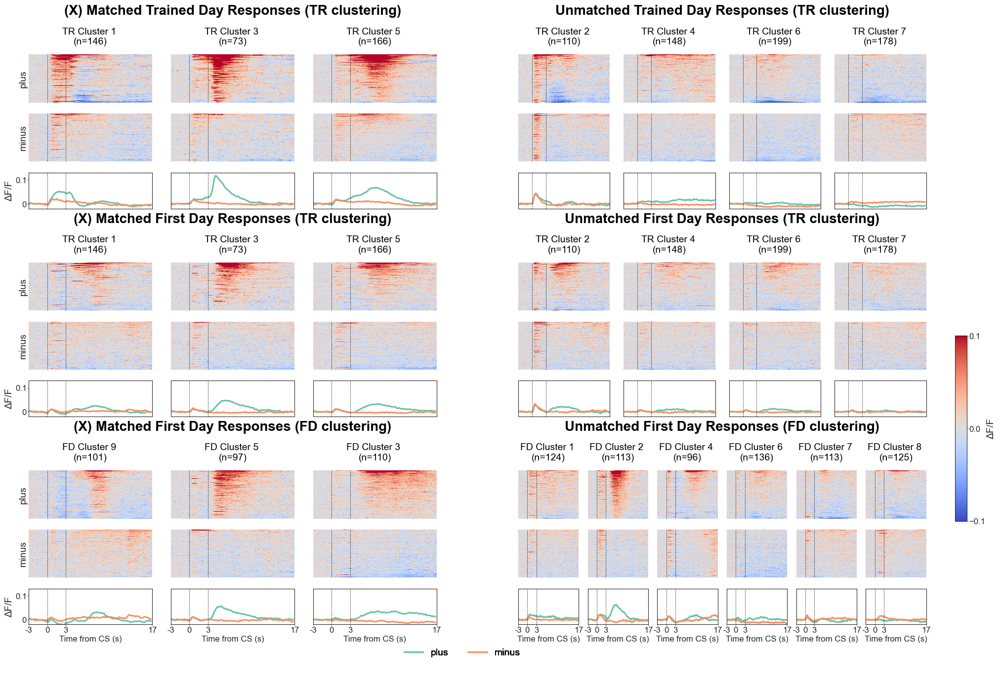

In [135]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import matplotlib.patheffects as pe

# --- Keep text as editable vectors in SVGs ---
mpl.rcParams['svg.fonttype'] = 'none'

# --------------------------------------------
# Inputs expected in your environment:
# sig_matches: list of (fd_idx, tr_idx) tuples, 0-based (e.g., [(8,0),(4,2),(2,4)])
# align_pop_trained, align_pop_firstday: dicts of conditions (preserve your order)
# longitudinal_trainedlabels, longitudinal_firstdaylabels (start at -1; -1 is invalid)
# longitudinaltraineddata, longitudinalfirstdaydata
# window_size, pre_window_size, frames_to_reward, framerate, sortwindow
# cmax = 0.10 (or set as you like)
# --------------------------------------------

# Full label arrays (can contain -1 → ignored by equality selection)
labels_tr_full = np.asarray(longitudinal_trainedlabels[0, :]).astype(int)
labels_fd_full = np.asarray(longitudinal_firstdaylabels[0, :]).astype(int)

# Conditions
conditions_tr = list(align_pop_trained.keys())
conditions_fd = list(align_pop_firstday.keys())

# Sort matches by trained cluster index (columns ordered by TR)
sig_matches_sorted = sorted(sig_matches, key=lambda p: p[1])
fd_cols_matched  = [fd for fd, tr in sig_matches_sorted]
tr_cols_matched  = [tr for fd, tr in sig_matches_sorted]
n_cols_matched   = len(tr_cols_matched)

# Build UNMATCHED sets
all_tr = sorted([c for c in np.unique(labels_tr_full) if c >= 0])
all_fd = sorted([c for c in np.unique(labels_fd_full) if c >= 0])
tr_cols_unmatched = [tr for tr in all_tr if tr not in tr_cols_matched]
fd_cols_unmatched = [fd for fd in all_fd if fd not in fd_cols_matched]
n_cols_unmatched  = max(len(tr_cols_unmatched), len(fd_cols_unmatched))  # robust to differing counts

# Helpers for x-ticks on bottom PSTH only
def xtick_positions():
    return [0, pre_window_size, pre_window_size + frames_to_reward, window_size]
def xtick_labels():
    secs = [(a - pre_window_size) / framerate for a in xtick_positions()]
    return [f"{s:.0f}" for s in secs]

# ------------------------------------------------------------
# Section renderer (no colorbar here; we’ll add ONE global colorbar later)
#   - columns are given explicitly per section
#   - only_leftmost_y: If True, only the very first column of the LEFT panel shows y labels/ticks
#   - show_psth_xticks: only True for the BOTTOM section of each panel
#   - panel_is_left: set True for the left panel; False for right panel
# ------------------------------------------------------------
import matplotlib.patheffects as pe  # <-- add this near your other imports

def plot_section(fig, gs_cell, labels_arr_full, data_arr, col_labels, figtitle,
                 title_mode='tr', align_pop=None, cmax=0.10,
                 show_psth_xticks=False, only_leftmost_y=True, panel_is_left=True,
                 add_section_star=False, star_dx=0.015, star_dy=0.003):
    """
    If add_section_star=True, a star '✱' is placed just to the right of the section title.
    star_dx, star_dy are offsets in FIGURE coordinates relative to the title position.
    """
    conditions = list(align_pop.keys()) if align_pop is not None else []
    n_cond = len(conditions)
    n_cols = len(col_labels)

    inner = gs_cell.subgridspec(nrows=n_cond + 1, ncols=n_cols,
                                height_ratios=[1]*n_cond + [0.75],
                                hspace=0.25, wspace=0.15)

    psth_colors = sns.color_palette("Set2", n_colors=n_cond)
    top_axes = []

    for ci, lab in enumerate(col_labels):
        psth_ax = fig.add_subplot(inner[n_cond, ci])
        psth_ax.grid(False)

        rows_idx = np.where(labels_arr_full == lab)[0]
        n_units = int(rows_idx.size)

        for ki, cond in enumerate(conditions):
            start = ki * window_size
            stop  = start + window_size
            temp_all = data_arr[rows_idx, start:stop] if rows_idx.size else np.empty((0, window_size))

            if temp_all.size:
                sorter = np.argsort(np.mean(temp_all[:, sortwindow[0]:sortwindow[1]], axis=1))[::-1]
                temp = temp_all[sorter]
            else:
                temp = temp_all

            ax_hm = fig.add_subplot(inner[ki, ci])
            if ki == 0:
                top_axes.append(ax_hm)

            hm = sns.heatmap(
                temp, ax=ax_hm,
                cmap="coolwarm", vmin=-cmax, vmax=cmax,
                cbar=False
            )
            ax_hm.grid(False)
            ax_hm.axvline(pre_window_size, ls="--", lw=.5, c="k")
            ax_hm.axvline(pre_window_size + frames_to_reward, ls="--", lw=.5, c="k")

            # Only far-left column of LEFT panel gets y-labels; heatmaps never get y-ticks
            if only_leftmost_y and not (panel_is_left and ci == 0):
                ax_hm.set_ylabel("")
            else:
                if ci == 0:
                    ax_hm.set_ylabel(f"{cond}", fontsize=14)
            ax_hm.set_yticks([])

            # Heatmaps never show x-ticks
            ax_hm.set_xticks([])
            ax_hm.set_xticklabels([])

            # Rasterize tiles only
            if ax_hm.collections:
                quad = ax_hm.collections[0]
                quad.set_rasterized(True)
                quad.set_zorder(-10)

            # Column title inside top heatmap, with unit count
            if ki == 0:
                disp = lab + 1
                prefix = "TR Cluster " if title_mode == 'tr' else "FD Cluster "
                ax_hm.set_title(f"{prefix}{disp} \n(n={n_units})", fontsize=14, pad=15)

            # PSTH
            psth = np.nanmean(temp, axis=0) if temp.size else np.zeros(window_size)
            psth_ax.plot(psth, color=psth_colors[ki], lw=2.2, label=cond if ci == 0 else None)

        # PSTH formatting
        psth_ax.axvline(pre_window_size, ls="--", lw=.5, c="k")
        psth_ax.axvline(pre_window_size + frames_to_reward, ls="--", lw=.5, c="k")
        psth_ax.set_xlim(0, window_size)
        psth_ax.set_ylim(-0.02, cmax + 0.03)
        psth_ax.tick_params(width=.5)

        if show_psth_xticks:
            psth_ax.set_xticks([0, pre_window_size, pre_window_size + frames_to_reward, window_size])
            secs = [(a - pre_window_size) / framerate for a in [0, pre_window_size, pre_window_size + frames_to_reward, window_size]]
            psth_ax.set_xticklabels([f"{s:.0f}" for s in secs], fontsize=12)
            psth_ax.set_xlabel(f"Time from {pre_label} (s)", fontsize=12)
        else:
            psth_ax.set_xticks([])
            psth_ax.set_xticklabels([])
            psth_ax.set_xlabel("")

        if only_leftmost_y and (panel_is_left and ci == 0):
            psth_ax.set_ylabel("ΔF/F", fontsize=14)
            psth_ax.set_yticks([0,cmax])
            psth_ax.set_yticklabels([0,cmax],fontsize=12)
        else:
            psth_ax.set_yticks([])
            psth_ax.set_ylabel("")

    # Legend once per section
    for ax in fig.axes[::-1]:
        handles, labels = ax.get_legend_handles_labels()
        if handles:
            fig.legend(handles, labels, loc=[0.4,0.035],
                       ncol=len(conditions), frameon=False, fontsize=14)
            break

    # Section title (figure coords), plus optional STAR
    if top_axes:
        fig.canvas.draw()
        left = min(ax.get_position().x0 for ax in top_axes)
        right = max(ax.get_position().x1 for ax in top_axes)
        topy = max(ax.get_position().y1 for ax in top_axes)
        title_x = 0.5 * (left + right)
        title_y = topy + 0.05

        fig.text(title_x, title_y, figtitle,
                 ha='center', va='bottom', fontsize=20, weight='bold')

        if add_section_star:
            # outlined star just to the right of the section title
            fig.text(title_x - star_dx, title_y - star_dy, '✱',
                     ha='left', va='bottom',
                     fontsize=24, fontweight='bold', color='black',
                     path_effects=[pe.withStroke(linewidth=2.5, foreground='black')],
                     zorder=10)


# ------------------------------------------------------------
# Figure with two vertical stacks side-by-side:
#   LEFT  = matched (from sig_matches)
#   RIGHT = unmatched (everything else)
#   ONE global colorbar for the entire figure
# ------------------------------------------------------------
# Canvas sizing
base_w, base_h = 2.2, 2.0
fig_w_left  = base_w * (max(1, n_cols_matched) + 0.6)
fig_w_right = base_w * (max(1, n_cols_unmatched) + 0.6)
fig_w = fig_w_left + fig_w_right + 1.0  # extra gap between panels
fig_h = (base_h * len(align_pop_trained) + 0.7) + \
        (base_h * len(align_pop_firstday) + 0.7) + \
        (base_h * len(align_pop_firstday) + 0.7) + 0.9

fig = plt.figure(figsize=(fig_w, fig_h))
outer = fig.add_gridspec(nrows=3, ncols=2, hspace=0.35, wspace=0.20)

# ---------------- LEFT PANEL: MATCHED ----------------
# Top: TR labels + TR data
plot_section(fig, outer[0, 0],
             labels_arr_full=labels_tr_full,
             data_arr=longitudinaltraineddata,
             col_labels=tr_cols_matched,
             figtitle="(X) Matched Trained Day Responses (TR clustering)",
             title_mode='tr',
             align_pop=align_pop_trained,
             cmax=cmax,
             show_psth_xticks=False,
             only_leftmost_y=True,
             panel_is_left=True,
             add_section_star=False)


# Middle: TR labels + FD data
plot_section(fig, outer[1, 0],
             labels_arr_full=labels_tr_full,
             data_arr=longitudinalfirstdaydata,
             col_labels=tr_cols_matched,
             figtitle="(X) Matched First Day Responses (TR clustering)",
             title_mode='tr',
             align_pop=align_pop_firstday,
             cmax=cmax,
             show_psth_xticks=False,
             only_leftmost_y=True,
             panel_is_left=True)

# Bottom: FD labels + FD data
plot_section(fig, outer[2, 0],
             labels_arr_full=labels_fd_full,
             data_arr=longitudinalfirstdaydata,
             col_labels=fd_cols_matched,
             figtitle="(X) Matched First Day Responses (FD clustering)",
             title_mode='fd',
             align_pop=align_pop_firstday,
             cmax=cmax,
             show_psth_xticks=True,   # ONLY bottom PSTH has ticks
             only_leftmost_y=True,
             panel_is_left=True)

# ---------------- RIGHT PANEL: UNMATCHED ----------------
plot_section(fig, outer[0, 1],
             labels_arr_full=labels_tr_full,
             data_arr=longitudinaltraineddata,
             col_labels=tr_cols_unmatched if len(tr_cols_unmatched) > 0 else [],
             figtitle="Unmatched Trained Day Responses (TR clustering)",
             title_mode='tr',
             align_pop=align_pop_trained,
             cmax=cmax,
             show_psth_xticks=False,
             only_leftmost_y=True,
             panel_is_left=False)

plot_section(fig, outer[1, 1],
             labels_arr_full=labels_tr_full,
             data_arr=longitudinalfirstdaydata,
             col_labels=tr_cols_unmatched if len(tr_cols_unmatched) > 0 else [],
             figtitle="Unmatched First Day Responses (TR clustering)",
             title_mode='tr',
             align_pop=align_pop_firstday,
             cmax=cmax,
             show_psth_xticks=False,
             only_leftmost_y=True,
             panel_is_left=False)

plot_section(fig, outer[2, 1],
             labels_arr_full=labels_fd_full,
             data_arr=longitudinalfirstdaydata,
             col_labels=fd_cols_unmatched if len(fd_cols_unmatched) > 0 else [],
             figtitle="Unmatched First Day Responses (FD clustering)",
             title_mode='fd',
             align_pop=align_pop_firstday,
             cmax=cmax,
             show_psth_xticks=True,
             only_leftmost_y=True,
             panel_is_left=False)

# ---------------- ONE GLOBAL COLORBAR ----------------
# Place after all heatmaps are drawn; match the same vmin/vmax and cmap as the heatmaps
norm = Normalize(vmin=-cmax, vmax=cmax)
sm = ScalarMappable(norm=norm, cmap='coolwarm')
sm.set_array([])

# Add a single colorbar on the far right
cbar_ax = fig.add_axes([0.925, 0.25, 0.01, 0.25])  # x, y, width, height (figure coords)
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('ΔF/F', fontsize=14)
cbar.set_ticks([-cmax,0,cmax])
cbar.ax.tick_params(labelsize=12, width=0.5)

plt.tight_layout()
# Optionally save:
fig.savefig(longitudinal_figure_folder + "FIG3_STACKED_AND_MATCHED_HEATMAPS.svg", format="svg", bbox_inches="tight", dpi=200)
plt.show()


In [41]:
# import plotly.io as pio
# pio.renderers.default = "browser"

In [42]:
# # Sankey plot of first day clustering labels vs trained day labels
# # 1) contingency → rows = A-clusters, columns = B-clusters
# labels_A = longitudinal_firstdaylabels
# labels_B = longitudinal_trainedlabels
# cmat = contingency_matrix(labels_A, labels_B)
# n_A, n_B = cmat.shape

# # 2) construct node list
# nodes_A = [f"A{i}" for i in range(n_A)]
# nodes_B = [f"B{j}" for j in range(n_B)]
# all_nodes = nodes_A + nodes_B

# # 3) links: every non-zero cell becomes a flow
# src, tgt, val = [], [], []
# for i in range(n_A):
#     for j in range(n_B):
#         cnt = cmat[i, j]
#         if cnt:
#             src.append(i)              # index in all_nodes list
#             tgt.append(n_A + j)        # shift so B-nodes start after A-nodes
#             val.append(cnt)

# # 4) Sankey figure
# fig = go.Figure(go.Sankey(
#     node = dict(label = all_nodes, pad=15, thickness=20),
#     link = dict(source=src, target=tgt, value=val)
# ))
# fig.update_layout(title=f"Sankey diagram – Adjusted Rand = {adjusted_rand_score(labels_A, labels_B):.3f}")
# fig.show()

In [43]:
# fig.write_html("sankey_plot_longitudinal_cells_firstday_vs_trained_clstlabels.html",            # file name / path
#                include_plotlyjs="cdn",                # or True for fully-self-contained
#                full_html=True)

## (FIG3) Chi squared Goodness of fit test

The null distribution is the proportion of each first day cluster to total cells

In [43]:
def chi_square_gof_numeric(labels, p_null):
    """
    χ² goodness-of-fit for numeric labels 0..K-1
    -------------------------------------------
    labels  : 1-D array-like of observed integer labels
    p_null  : 1-D array-like of expected probabilities, same length as #labels
              e.g. p_null = [0.10, 0.15, 0.05, ..., 0.08]
    """
    
    labels = np.asarray(labels, dtype=np.int64)
    p_null = np.asarray(p_null, dtype=float)
    K = len(p_null) # 1. observed counts aligned by label value
    counts = np.bincount(labels, minlength=K)      # [O₀, O₁, …, O_{K-1}]
    n = counts.sum() # 2. expected counts under H₀
    expected = n * p_null                          # [E₀, E₁, …, E_{K-1}]

    # 3. χ² test
    chi2, p = stats.chisquare(f_obs=counts, f_exp=expected)

    return chi2, p

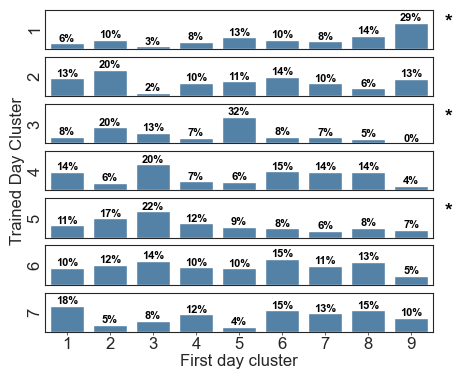

In [44]:
# chi square with average counts
A = np.asarray(longitudinal_firstdaylabels + 1)
B = np.asarray(longitudinal_trainedlabels + 1)

K_A = len(np.unique(A))
K_B = len(np.unique(B))
unique_B = np.arange(K_B)

pvals = np.zeros((int(B.max())+1,1))-1

# ---- Build a single null distribution from ALL last-day labels ------
# (flatten B, drop skip_label if requested)
flatA = A.flatten()
null_labels = flatA[flatA > 0]

_, null_dist = np.unique(null_labels, return_counts=True)
null_dist = np.asarray(null_dist, dtype=np.float64)
null_dist /= null_dist.sum() 

for j, b_lab in enumerate(unique_B):
    counts = avg_cont[1:, j]
    # χ² GOF (one-way) for this pair/column
    obs_dist = np.concatenate([int(np.round(count))*[i] for i, count in enumerate(counts)])
    _, p = chi_square_gof_numeric(obs_dist, null_dist)
    pvals[j] = p

# ---- Multiple comparisons across B labels ---------------------------
adj_p = multipletests(pvals.squeeze(), alpha=0.05, method='fdr_bh')[1]

# ---- Plot: one bar histogram per B label using the averaged contingency ----
unique_A = np.arange(K_A)[1:]
unique_B = np.arange(K_B)
n_B = len(unique_B)

fig = plt.figure(figsize=(5, max(1.5, 0.6 * n_B)))
for j, b_lab in enumerate(unique_B[1:]):
    counts = avg_cont[1:, b_lab]
    total  = counts.sum()

    ax = plt.subplot(n_B, 1, j + 1)
    sns.barplot(x=unique_A, y=counts, ax=ax, color='steelblue')

    # p-value (Fisher-combined across all pairs) for this B label
    # ax.text(1.2, 1, f"p {adj_p[b_lab]:.3g}",
    #         transform=ax.transAxes, ha='right', va='top', fontsize=8, fontweight='bold')
    if adj_p[b_lab] < 0.01: ax.text(1.05, 0.9, "*", transform=ax.transAxes, ha='right', va='top', fontsize=14, fontweight='bold')

    # annotate each bar with its % within this B label
    for bar, cnt in zip(ax.patches, counts):
        pct = 100 * cnt / total if total else 0
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
                f'{pct:.0f}%', ha='center', va='bottom', fontsize=8, weight='bold')

    if j == n_B - 2:
        ax.set_xlabel('First day cluster', fontsize=12)
    else:
        ax.set_xticks([])
    ax.set_yticks([])
    if j == 3: ax.set_ylabel(f'Trained Day Cluster\n{b_lab}', fontsize=12)
    else: ax.set_ylabel(f'{b_lab}', fontsize=12)
    ax.set_ylim(0, max(counts.max() * 1.5, 1))  # headroom
    ax.tick_params(axis='x', labelsize=12) 

# plt.suptitle("First day Clustering Per Trained Cluster")
# plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# fig.savefig(longitudinal_figure_folder + "firstday_to_trained_clusters.svg", format="svg", bbox_inches="tight")

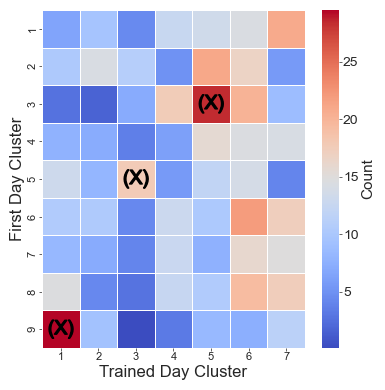

In [106]:
# ---- Heatmap of average counts: First-day cluster (rows) × Trained-day cluster (cols) ----
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patheffects as pe

# Use the same cluster indexing convention as your code (skip 0)
row_labels = np.arange(1, K_A)   # first-day clusters
col_labels = np.arange(1, K_B)   # trained-day clusters

# Slice avg_cont to exclude the 0 label on both axes
M = np.asarray(avg_cont)[1:, 1:]  # shape: (K_A-1, K_B-1)

fig, ax = plt.subplots(figsize=(4,4))

hm = sns.heatmap(
    M,
    ax=ax,
    cmap='coolwarm',
    cbar=True,
    square=True,
    linewidths=0.5,
    linecolor='white',
    xticklabels=col_labels,
    yticklabels=row_labels
)

# Labels and formatting
ax.set_xlabel('Trained Day Cluster', fontsize=12)
ax.set_ylabel('First Day Cluster', fontsize=12)
cbar = hm.collections[0].colorbar
cbar.set_label('Count', fontsize=11)
cbar.ax.tick_params(labelsize=10)

sig_matches = [] # row, col indices corresponding to FD, TR matches 

# --- Add large asterisks in columns (trained clusters) that are significant ---
# We skip label 0, so trained-day columns are 1..K_B-1 and map to heatmap columns 0..K_B-2
for b_lab in range(1, K_B):
    if adj_p[b_lab] < 0.01:
        col_idx = b_lab - 1  # heatmap column index
        # find row (first-day cluster) with the max count in this column
        row_idx = int(np.nanargmax(M[:, col_idx]))
        sig_matches.append((row_idx, col_idx))
        # draw a big, outlined asterisk centered in the cell
        ax.text(col_idx + 0.5, row_idx + 0.5, '(X)',
                ha='center', va='center',
                fontsize=14, fontweight='light', color='black',
                path_effects=[pe.withStroke(linewidth=1, foreground='black')],
                zorder=5)

# # Optional: annotate each cell with its raw count
# for i in range(M.shape[0]):
#     for j in range(M.shape[1]):
#         ax.text(j + 0.5, i + 0.5, f'{int(M[i, j])}', ha='center', va='center', fontsize=8, color='black')

plt.tight_layout()
plt.show()

fig.savefig(longitudinal_figure_folder + "FIG3_firstday_to_trained_clusters_heatmap.svg", format="svg", bbox_inches="tight")

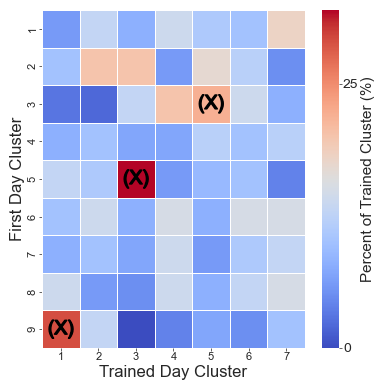

In [47]:
# ---- Heatmap of percentages: First-day cluster (rows) × Trained-day cluster (cols) ----
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patheffects as pe

# Use the same cluster indexing convention as your code (skip 0)
row_labels = np.arange(1, K_A)   # first-day clusters
col_labels = np.arange(1, K_B)   # trained-day clusters

# Slice avg_cont to exclude the 0 label on both axes (counts -> M)
M = np.asarray(avg_cont)[1:, 1:]  # shape: (K_A-1, K_B-1)

# ---- Convert counts to column-wise percentages ----
# Each trained-day column sums to ~100%. Handles zero columns robustly.
col_sums = M.sum(axis=0, keepdims=True)
with np.errstate(divide='ignore', invalid='ignore'):
    P = 100.0 * M / col_sums
P = np.nan_to_num(P, nan=0.0)         # replace NaNs from zero columns with 0%
P_round = np.rint(P)                   # rounded percentages (nearest integer)

fig, ax = plt.subplots(figsize=(4, 4))

hm = sns.heatmap(
    P_round,
    ax=ax,
    cmap='coolwarm',
    # vmin=0, vmax=100,                  # 0–100% scale
    cbar=True,
    square=True,
    linewidths=0.5,
    linecolor='white',
    xticklabels=col_labels,
    yticklabels=row_labels,
    cbar_kws={"label": "Percent of Trained Cluster (%)", "ticks": [0, 25, 50, 75, 100]}
)

# Labels and formatting
ax.set_xlabel('Trained Day Cluster', fontsize=12)
ax.set_ylabel('First Day Cluster', fontsize=12)

# Style the colorbar
cbar = hm.collections[0].colorbar
cbar.set_label('Percent of Trained Cluster (%)', fontsize=11)
cbar.ax.tick_params(labelsize=10)

sig_matches = []  # (row, col) indices of FD–TR matches

# --- Add markers in significant trained-day columns (same logic, now using % matrix) ---
for b_lab in range(1, K_B):
    if adj_p[b_lab] < 0.01:
        col_idx = b_lab - 1  # heatmap column index
        row_idx = int(np.nanargmax(P[:, col_idx]))  # max percentage row for that column
        sig_matches.append((row_idx, col_idx))
        ax.text(col_idx + 0.5, row_idx + 0.5, '(X)',
                ha='center', va='center',
                fontsize=14, fontweight='light', color='black',
                path_effects=[pe.withStroke(linewidth=1, foreground='black')],
                zorder=5)

# # Optional: annotate each cell with its rounded percent (e.g., "37%")
# for i in range(P_round.shape[0]):
#     for j in range(P_round.shape[1]):
#         ax.text(j + 0.5, i + 0.5, f'{int(P_round[i, j])}%', ha='center', va='center',
#                 fontsize=8, color='black')

plt.tight_layout()
plt.show()

# Save
fig.savefig(longitudinal_figure_folder + "FIG3_firstday_to_trained_clusters_heatmap_percentages.svg", format="svg", bbox_inches="tight")


In [52]:
def find_mode_1d(arr):
    # mode() returns a ModeResult object, access the mode value with .mode[0]
    return stats.mode(arr)[0]

In [53]:
# chi square with average counts
A = np.apply_along_axis(find_mode_1d, axis=0, arr=np.asarray(longitudinal_firstdaylabels + 1))
B = np.apply_along_axis(find_mode_1d, axis=0, arr=np.asarray(longitudinal_trainedlabels + 1))

pvals = np.zeros((int(B.max())+1,1))-1

# ---- Build a single null distribution from ALL last-day labels ------
# (flatten B, drop skip_label if requested)
flatA = A.flatten()
null_labels = flatA[flatA > 0]

_, null_dist = np.unique(null_labels, return_counts=True)
null_dist = np.asarray(null_dist, dtype=np.float64)
null_dist /= null_dist.sum() 

for j, b_lab in enumerate(unique_B):
    counts = avg_cont[1:, j]
    # χ² GOF (one-way) for this pair/column
    obs_dist = np.concatenate([int(np.round(count))*[i] for i, count in enumerate(counts)])
    _, p = chi_square_gof_numeric(obs_dist, null_dist)
    pvals[j] = p

# ---- Multiple comparisons across B labels ---------------------------
adj_p = multipletests(pvals.squeeze(), alpha=0.05, method='fdr_bh')[1]

# ---- Plot: one bar histogram per B label using the averaged contingency ----
unique_A = np.arange(K_A)[keep_A]
unique_B = np.arange(K_B)
n_B = len(unique_B)

plt.figure(figsize=(5, max(1.5, 0.6 * n_B)))
for j, b_lab in enumerate(unique_B):
    counts = avg_cont[keep_A, b_lab]
    total  = counts.sum()

    ax = plt.subplot(n_B, 1, j + 1)
    sns.barplot(x=unique_A, y=counts, ax=ax, color='steelblue')

    # p-value (Fisher-combined across all pairs) for this B label
    ax.text(1.2, 1, f"p {adj_p[b_lab]:.3g}",
            transform=ax.transAxes, ha='right', va='top', fontsize=8, fontweight='bold')

    # annotate each bar with its % within this B label
    for bar, cnt in zip(ax.patches, counts):
        pct = 100 * cnt / total if total else 0
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
                f'{pct:.1f}%', ha='center', va='bottom', fontsize=6, weight='bold')

    if j == n_B - 1:
        ax.set_xlabel('First day cluster')
    else:
        ax.set_xticks([])
    ax.set_ylabel(f'Trained {b_lab}', fontsize=6)
    ax.set_ylim(0, max(counts.max() * 1.15, 1))  # headroom

plt.suptitle("First day Clustering Per Trained Cluster (Max)")
# plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

NameError: name 'unique_B' is not defined

Previous

In [80]:
_, null = np.unique(longitudinal_firstdaylabels, return_counts=True)
null = null[1:] / null[1:].sum()

null_labels = np.array(longitudinal_firstdaylabels)
null_labels = null_labels[null_labels > -1]
print(null)

_, check = np.unique(null_labels, return_counts=True)
print(check / check.sum())

[0.11921182 0.09064039 0.13103448 0.12512315 0.11330049 0.09852217
 0.11330049 0.10541872 0.10344828]
[0.11921182 0.09064039 0.13103448 0.12512315 0.11330049 0.09852217
 0.11330049 0.10541872 0.10344828]


In [85]:
# assume cmat (rows=A, cols=B) is already computed
unique_A = np.unique(labels_A)          # cache once
unique_B = np.unique(labels_B)
n_B      = len(unique_B)

alpha_grid   = [0.10, 0.05, 0.01, 0.001]
adj_method   = 'fdr_bh'

chi2_pvals = np.zeros(unique_B.shape)

for j, b_lab in enumerate(unique_B):
    counts = cmat[1:, j]                              # counts for this B
    total  = counts.sum()                            # denominator for %

    # chi square test against first day null dist.
    obs_dist = np.concatenate([count*[i] for i, count in enumerate(counts)])
    chi2, p = chi_square_gof_numeric(obs_dist, null)

    chi2_pvals[j] = p


# multiple comparisons adjustment
adj_chi2_p = np.zeros((len(chi2_pvals), len(alpha_grid)))
for ida, alpha in enumerate(alpha_grid):
    adj_chi2_p[:, ida] = multipletests(chi2_pvals, alpha=alpha, method=adj_method)[1]

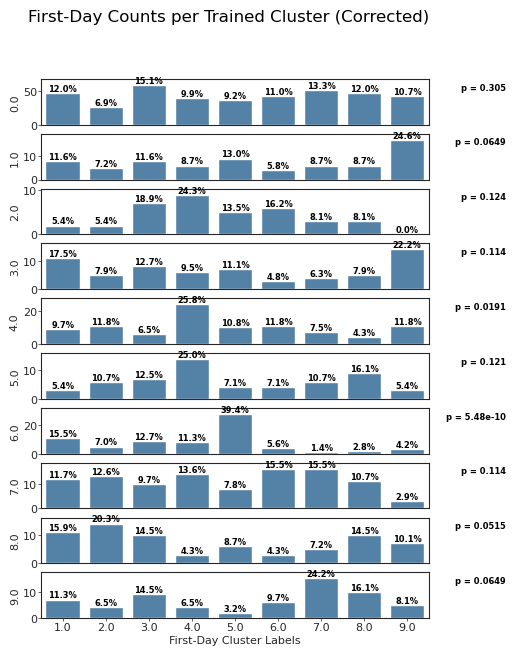

In [87]:
plt.figure(figsize=(5, 0.7*n_B))
for j, b_lab in enumerate(unique_B):
    counts = cmat[1:, j]                              # counts for this B
    total  = counts.sum()                            # denominator for %
    
    ax = plt.subplot(n_B, 1, j + 1)
    sns.barplot(x=unique_A[1:] + 1, y=counts, ax=ax, color='steelblue')

    ax.text(1.2, 0.92, f"p = {adj_chi2_p[j,0]:.3g}", transform=ax.transAxes,
        ha='right', va='top', fontsize=6, fontweight='bold')
    
    # ── annotate each bar ──────────────────────────────────────────────────
    for bar, cnt in zip(ax.patches, counts):
        pct = 100 * cnt / total if total else 0
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'{pct:.1f}%',
            ha='center', va='bottom', fontsize=6, weight='bold'
        )
    
    # axis cosmetics
    if j == len(unique_B)-1:
        ax.set_xlabel('First-Day Cluster Labels')
    else:
        ax.set_xticks([])
    ax.set_ylabel(f'{b_lab + 1}')
    ax.set_ylim(0, max(counts) * 1.15)   # leave head-room for text

plt.suptitle("First-Day Counts per Trained Cluster (Corrected)")
# plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()